## Importing Libraries

In [ ]:
!pip install Augmentor
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 20.0 MB/s eta 0:00:00


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.patches as patches
import cv2
import math
import os
import zipfile
import random
import shutil
import Augmentor
from sklearn.model_selection import train_test_split
from ultralytics import YOLO
from PIL import Image
from IPython.display import display

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
from google.colab import drive # Import the Google Drive module to access files stored in your Drive account
drive.mount('/content/drive') # Mount Google Drive to the Colab environment so you can read and write files

Mounted at /content/drive


## EDA

In [ ]:
zip_path = '/content/drive/MyDrive/brain_tumor_object_detection.zip' # Define the path to the ZIP file containing the brain tumor dataset
extract_path = '/content/drive/MyDrive/brain_tumor_object_detection/data' # Define the folder path where the dataset will be extracted

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path) # Extract the contents of the ZIP file into the specified directory

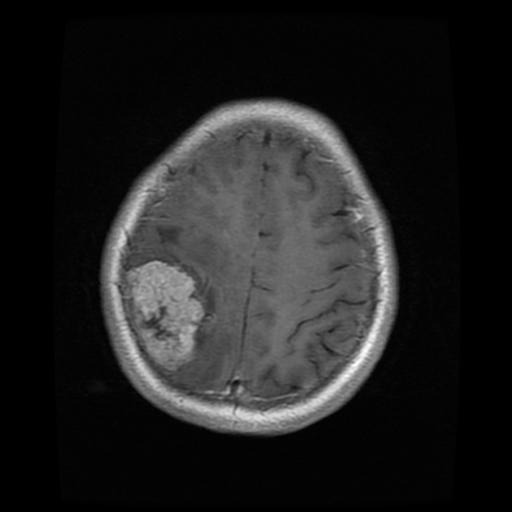

In [ ]:
sample_image = Image.open('/content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/meningioma/Tr-me_0011.jpg')
sample_image # Load and display a sample MRI image from the extracted dataset

In [ ]:
sample_image.size

(512, 512)

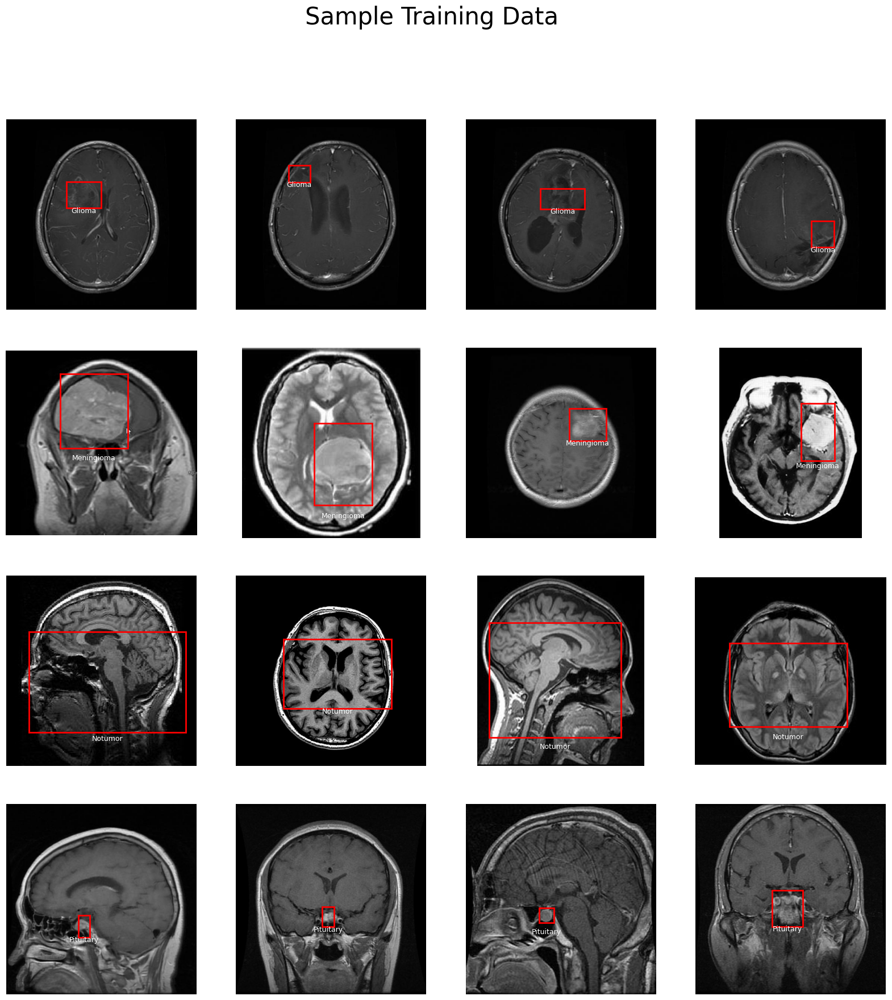

In [ ]:
# Plotting the training data with bounding boxes
dataset_directory = '/content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/'
class_labels = {'glioma': 0, 'meningioma': 1, 'notumor': 2, 'pituitary': 3}

fig, axes = plt.subplots(4, 4, figsize=(20, 20))

for class_name, ax_row in zip(class_labels.keys(), axes):
    class_directory = os.path.join(dataset_directory, class_name)
    image_files = [f for f in os.listdir(class_directory) if f.endswith('.jpg')]
    selected_images = random.sample(image_files, 4)

    for ax, image_file in zip(ax_row, selected_images):
        annotation_file = os.path.join(class_directory, image_file.replace('.jpg', '.txt'))
        with open(annotation_file, 'r') as file:
            line = file.readline().strip().split()
            class_number, centre_x, centre_y, height, width = map(float, line)

        img = plt.imread(os.path.join(class_directory, image_file))

        if len(img.shape) == 2:
            img = np.stack((img,) * 3, axis=-1)

        img_height, img_width, _ = img.shape
        x_min = (centre_x - width / 2) * img_width
        y_min = (centre_y - height / 2) * img_height
        x_max = (centre_x + width / 2) * img_width
        y_max = (centre_y + height / 2) * img_height
        tumor_bbox = patches.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, linewidth=2, edgecolor='r', facecolor='none', label=f'{class_name.capitalize()}')
        ax.imshow(img)
        ax.add_patch(tumor_bbox)

        label_text = f'{class_name.capitalize()}'
        ax.text((x_min + x_max) / 2, y_max + 18, label_text, color='w', ha='center', va='bottom', fontsize=9)

for ax_row in axes:
    for ax in ax_row:
        ax.axis('off')

plt.suptitle("Sample Training Data", fontsize=30)
plt.show()

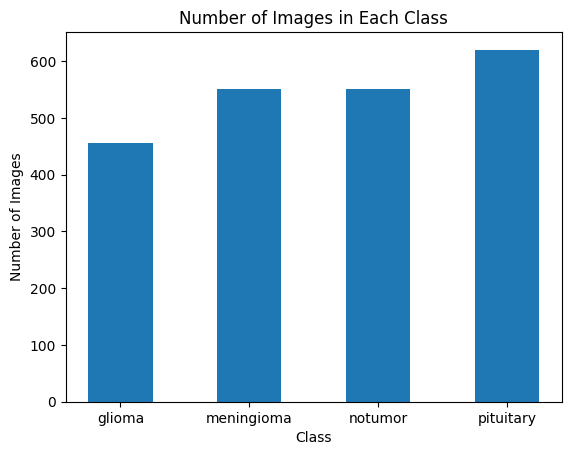

In [ ]:
class_names = ['glioma', 'meningioma', 'notumor', 'pituitary']
class_counts = [456, 551, 550, 620]

plt.bar(class_names, class_counts, width=0.5)
plt.xlabel('Class')
plt.ylabel('Number of Images')
plt.title('Number of Images in Each Class')
plt.show() #Visualizes the number of MRI images available for each brain tumor class to check dataset balance.

## Train-Test Split

In [ ]:
import os
import shutil
from sklearn.model_selection import train_test_split

def custom_train_val_test_split(dataset_directory, train_ratio=0.7, val_ratio=0.15, test_ratio=0.15, random_seed=None, min_samples_per_class=2):
    """
    Custom function to perform a stratified train-validation-test split on an image dataset.
    This function organizes the dataset into 'train', 'val', and 'test' directories while maintaining the class-wise distribution.
    It creates the 'train', 'val', and 'test' directories within the given dataset directory and moves images accordingly.
    """
    random_seed = random_seed or 42

    # List class directories (e.g., subdirectories representing each class)
    class_directories = [d for d in os.listdir(dataset_directory) if os.path.isdir(os.path.join(dataset_directory, d))]

    # Create directories for train, validation, and test sets
    train_directory = os.path.join(dataset_directory, 'train')
    val_directory = os.path.join(dataset_directory, 'val')
    test_directory = os.path.join(dataset_directory, 'test')

    os.makedirs(train_directory, exist_ok=True)
    os.makedirs(val_directory, exist_ok=True)
    os.makedirs(test_directory, exist_ok=True)

    for class_dir in class_directories:
        class_path = os.path.join(dataset_directory, class_dir)

        # Get the list of image files in the class directory
        image_files = [f for f in os.listdir(class_path) if f.endswith('.jpg')]

        # Skip classes with fewer than the minimum required samples
        if len(image_files) < min_samples_per_class:
            continue

        # Split images into train and (val + test)
        train_images, remaining_images = train_test_split(image_files, test_size=1 - train_ratio, random_state=random_seed)

        # Split remaining images into validation and test
        val_images, test_images = train_test_split(remaining_images, test_size=test_ratio / (test_ratio + val_ratio), random_state=random_seed)

        # Move training images
        for image in train_images:
            src_image_path = os.path.join(class_path, image)
            src_annotation_path = os.path.join(class_path, image.replace('.jpg', '.txt'))

            dest_image_path = os.path.join(train_directory, class_dir, image)
            dest_annotation_path = os.path.join(train_directory, class_dir, image.replace('.jpg', '.txt'))

            os.makedirs(os.path.dirname(dest_image_path), exist_ok=True)

            if os.path.exists(src_annotation_path):
                shutil.move(src_image_path, dest_image_path)
                shutil.move(src_annotation_path, dest_annotation_path)

        # Move validation images
        for image in val_images:
            src_image_path = os.path.join(class_path, image)
            src_annotation_path = os.path.join(class_path, image.replace('.jpg', '.txt'))

            dest_image_path = os.path.join(val_directory, class_dir, image)
            dest_annotation_path = os.path.join(val_directory, class_dir, image.replace('.jpg', '.txt'))

            os.makedirs(os.path.dirname(dest_image_path), exist_ok=True)

            if os.path.exists(src_annotation_path):
                shutil.move(src_image_path, dest_image_path)
                shutil.move(src_annotation_path, dest_annotation_path)

        # Move test images
        for image in test_images:
            src_image_path = os.path.join(class_path, image)
            src_annotation_path = os.path.join(class_path, image.replace('.jpg', '.txt'))

            dest_image_path = os.path.join(test_directory, class_dir, image)
            dest_annotation_path = os.path.join(test_directory, class_dir, image.replace('.jpg', '.txt'))

            os.makedirs(os.path.dirname(dest_image_path), exist_ok=True)

            if os.path.exists(src_annotation_path):
                shutil.move(src_image_path, dest_image_path)
                shutil.move(src_annotation_path, dest_annotation_path)



In [ ]:
dataset_directory = '/content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/'

custom_train_val_test_split(dataset_directory, train_ratio=0.7, val_ratio=0.15, test_ratio=0.15, random_seed=42, min_samples_per_class=2)


In [ ]:
def count_images_per_class(directory):
    class_counts = {}
    for class_dir in os.listdir(directory):
        class_path = os.path.join(directory, class_dir)
        if os.path.isdir(class_path):
            class_counts[class_dir] = len([f for f in os.listdir(class_path) if f.endswith('.jpg')])
    return class_counts # function to count the images per class

In [ ]:
import os
import matplotlib.pyplot as plt

def count_images_per_class(directory):
    """
    Count the number of images in each class within the given directory.
    Assumes that the directory contains subdirectories where each subdirectory represents a class.
    """
    class_counts = {}
    class_directories = [d for d in os.listdir(directory) if os.path.isdir(os.path.join(directory, d))]

    for class_dir in class_directories:
        class_path = os.path.join(directory, class_dir)
        image_files = [f for f in os.listdir(class_path) if f.endswith('.jpg')]
        class_counts[class_dir] = len(image_files)

    return class_counts

def plot_image_counts(train_directory, val_directory, test_directory):
    """
    Plot the number of images in each class for the train, validation, and test sets.
    This function counts the number of images in each class for each set
    and plots a bar chart to visualize the distribution.
    """
    train_counts = count_images_per_class(train_directory)
    val_counts = count_images_per_class(val_directory)
    test_counts = count_images_per_class(test_directory)

    class_names = list(train_counts.keys())
    train_counts_values = list(train_counts.values())
    val_counts_values = [val_counts.get(class_name, 0) for class_name in class_names]  # Default to 0 if the class is not in val
    test_counts_values = [test_counts.get(class_name, 0) for class_name in class_names]  # Default to 0 if the class is not in test

    bar_width = 0.25
    index = range(len(class_names))

    fig, ax = plt.subplots()
    bar1 = ax.bar(index, train_counts_values, bar_width, label='Train')
    bar2 = ax.bar([i + bar_width for i in index], val_counts_values, bar_width, label='Validation')
    bar3 = ax.bar([i + 2 * bar_width for i in index], test_counts_values, bar_width, label='Test')

    ax.set_xlabel('Class')
    ax.set_ylabel('Number of Images')
    ax.set_title('Number of Images in Each Class for Train, Validation, and Test Sets')
    ax.set_xticks([i + bar_width for i in index])
    ax.set_xticklabels(class_names)
    ax.legend()

    plt.show()


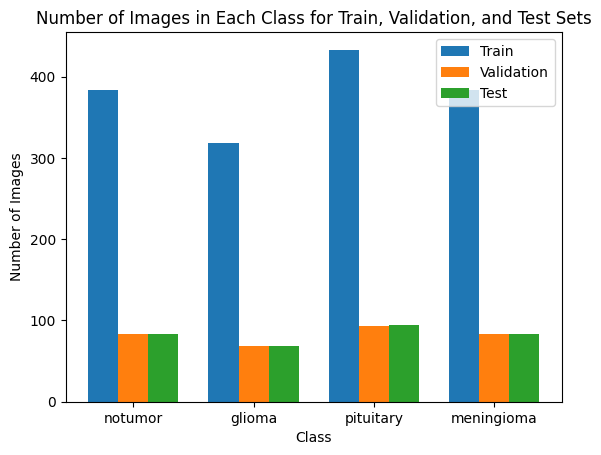

In [ ]:
dataset_directory = '/content/drive/MyDrive/brain_tumor_object_detection/data/brain_tumor_object_detection/data/Brain Tumor labeled dataset/'
train_directory = os.path.join(dataset_directory, 'train')
val_directory = os.path.join(dataset_directory, 'val')
test_directory = os.path.join(dataset_directory, 'test')

plot_image_counts(train_directory, val_directory, test_directory) #plot number of images per class

Create yaml file

In [ ]:
yaml_text = """\
path: /content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/

train: /content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/train
val: /content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/val
test: /content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test

names:
  0: pituitary
  1: meningioma
  2: glioma
  3: notumor
"""

# Save YAML file
yaml_path = "/content/drive/MyDrive/brain_tumor_object_detection/brain_tumor_dataset.yaml"
with open(yaml_path, "w") as f:
    f.write(yaml_text)

print("✅ YAML file saved at:", yaml_path)


✅ YAML file saved at: /content/drive/MyDrive/brain_tumor_object_detection/brain_tumor_dataset.yaml


### Modelling YOLO12n

In [ ]:
yolo_btd_model = YOLO('yolo12n.pt')  # Initialize the YOLOv8 Nano model using the configuration file 'yolov8n.yaml'

# Train the YOLOv8 model on the specified brain tumor dataset for 25 epochs
yolo_btd_model_results = yolo_btd_model.train(data='/content/drive/MyDrive/brain_tumor_object_detection/brain_tumor_dataset.yaml', epochs=40, batch=32, optimizer= "Adamax",  momentum=0.937, verbose=True,patience=10 )

Ultralytics 8.3.229 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/brain_tumor_object_detection/brain_tumor_dataset.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=40, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo12n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train9, nbs=64, nms=False, opset=None, optimize=False, optimizer=Adamax, overlap_mask=True

Save the model results to drive

In [ ]:
!mkdir -p /content/drive/MyDrive/brain_tumor_object_detection/trained_models1new/ # Create a new directory in Google Drive to store the trained YOLOv8 model
!cp -r /content/runs/detect/train9 /content/drive/MyDrive/brain_tumor_object_detection/trained_models1new/ # Copy the trained model files from the local Colab directory to the newly created folder in Google Drive

Model evaluation on test data

In [ ]:
from ultralytics import YOLO

model = YOLO('/content/drive/MyDrive/brain_tumor_object_detection/trained_models1new/train9/weights/best.pt') #load the trained model

metrics = model.val(
    data='/content/brain_tumor_dataset.yaml',
    split='test',
    imgsz=320,
    conf=0.3,
    save_json=True
)

print(f"mAP@0.5: {metrics.box.map50:.4f}")
print(f"mAP@0.5–0.95: {metrics.box.map:.4f}")
print(f"Precision: {metrics.box.mp:.4f}")
print(f"Recall: {metrics.box.mr:.4f}") # Evaluate precision, recall and mean average precision on test set

Ultralytics 8.3.229 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12n summary (fused): 159 layers, 2,557,508 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 1.1±0.7 ms, read: 10.9±8.3 MB/s, size: 24.6 KB)
val: Scanning /content/drive/MyDrive/brain_tumor_object_detection/data/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/glioma.cache... 329 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 329/329 471.4Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 21/21 5.9it/s 3.5s
                   all        329        331      0.855      0.795      0.868      0.529
                glioma         94         94      0.892      0.879      0.933      0.474
            meningioma         83         83      0.931      0.855      0.921      0.588
               notumor         70         72       0.69      0.496      0.642      0.338
             pituitary         82   

Create dataset yaml file in colab

In [ ]:
yaml_text = """\
path: /content/drive/MyDrive/brain_tumor_object_detection/data/brain_tumor_object_detection/data/Brain Tumor labeled dataset/

train: /content/drive/MyDrive/brain_tumor_object_detection/data/brain_tumor_object_detection/data/Brain Tumor labeled dataset/train
val: /content/drive/MyDrive/brain_tumor_object_detection/data/brain_tumor_object_detection/data/Brain Tumor labeled dataset/val
test: /content/drive/MyDrive/brain_tumor_object_detection/data/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test

names:
  0: glioma
  1: meningioma
  2: notumor
  3: pituitary
"""

# Save YAML file
yaml_path = "/content/brain_tumor_dataset.yaml"
with open(yaml_path, "w") as f:
    f.write(yaml_text)

print("✅ YAML file saved at:", yaml_path)
!cat /content/brain_tumor_dataset.yaml

✅ YAML file saved at: /content/brain_tumor_dataset.yaml
path: /content/drive/MyDrive/brain_tumor_object_detection/data/brain_tumor_object_detection/data/Brain Tumor labeled dataset/

train: /content/drive/MyDrive/brain_tumor_object_detection/data/brain_tumor_object_detection/data/Brain Tumor labeled dataset/train
val: /content/drive/MyDrive/brain_tumor_object_detection/data/brain_tumor_object_detection/data/Brain Tumor labeled dataset/val
test: /content/drive/MyDrive/brain_tumor_object_detection/data/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test

names:
  0: glioma
  1: meningioma
  2: notumor
  3: pituitary


View the model results files in drive

In [ ]:
ls /content/runs/detect/train9

args.yaml                        results.csv          val_batch0_labels.jpg
BoxF1_curve.png                  results.png          val_batch0_pred.jpg
BoxP_curve.png                   train_batch0.jpg     val_batch1_labels.jpg
BoxPR_curve.png                  train_batch1440.jpg  val_batch1_pred.jpg
BoxR_curve.png                   train_batch1441.jpg  val_batch2_labels.jpg
confusion_matrix_normalized.png  train_batch1442.jpg  val_batch2_pred.jpg
confusion_matrix.png             train_batch1.jpg     weights/
labels.jpg                       train_batch2.jpg


### View results plots of the model

In [ ]:
def plot_images(image_paths):
    fig, axes = plt.subplots(len(image_paths), 1, figsize=(80, 80))

    for i, ax in enumerate(axes):
        image_path = image_paths[i]
        img = mpimg.imread(image_path)
        ax.imshow(img)
        ax.axis('off')
        ax.set_title(os.path.basename(image_path))

    plt.tight_layout()
    plt.show() # Defines a function to display multiple images vertically with titles using Matplotlib for visual inspection of MRI samples.

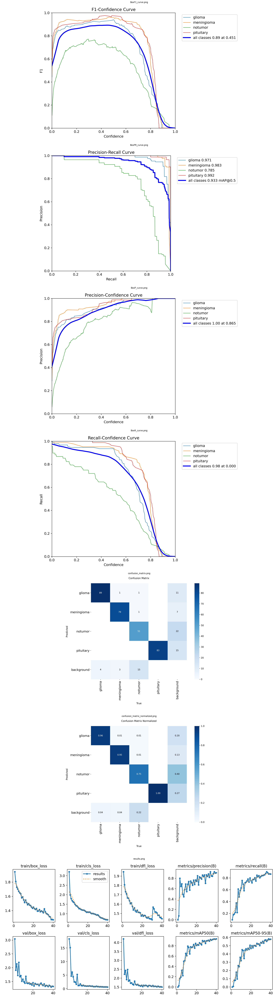

In [ ]:
image_paths = [
    '/content/drive/MyDrive/brain_tumor_object_detection/trained_models1new/train9/BoxF1_curve.png',
    '/content/drive/MyDrive/brain_tumor_object_detection/trained_models1new/train9/BoxPR_curve.png',
    '/content/drive/MyDrive/brain_tumor_object_detection/trained_models1new/train9/BoxP_curve.png',
    '/content/drive/MyDrive/brain_tumor_object_detection/trained_models1new/train9/BoxR_curve.png',
    '/content/drive/MyDrive/brain_tumor_object_detection/trained_models1new/train9/confusion_matrix.png',
    '/content/drive/MyDrive/brain_tumor_object_detection/trained_models1new/train9/confusion_matrix_normalized.png',
    '/content/drive/MyDrive/brain_tumor_object_detection/trained_models1new/train9/results.png',
]
plot_images(image_paths) # Specifies the file paths of YOLOv12 training result images and displays them using the previously defined function.

### Create images with bounding boxes (Predictions)

In [ ]:
def predict_results(test_images_dir, output_dir):
    model = YOLO('/content/drive/MyDrive/brain_tumor_object_detection/yolov12n/train9/weights/best.pt')
    os.makedirs(output_dir, exist_ok=True)

    image_files = [f for f in os.listdir(test_images_dir) if f.lower().endswith('.jpg')]

    for image_file in image_files:
        image_path = os.path.join(test_images_dir, image_file)
        model.predict(
            image_path,
            save=True,
            imgsz=320,
            conf=0.3,
            project=output_dir,
            name='',
            exist_ok=True
        )
# Defines a function that loads the trained model and generates predictions on all test images, saving the detected output images with bounding boxes to the specified output directory.


In [ ]:
from ultralytics import YOLO
glioma_test_dir = '/content/drive/MyDrive/brain_tumor_object_detection/data/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/glioma'
predict_results(glioma_test_dir, '/content/drive/MyDrive/brain_tumor_object_detection/inference_results_yolo12n/glioma_test_results')
# Loads the model and runs the predict_results() function to perform tumor detection on glioma test images, saving the predicted outputs to the specified inference results folder.



image 1/1 /content/drive/MyDrive/brain_tumor_object_detection/data/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/glioma/Tr-gl_0065.jpg: 320x320 (no detections), 62.6ms
Speed: 1.3ms preprocess, 62.6ms inference, 0.4ms postprocess per image at shape (1, 3, 320, 320)
Results saved to /content/drive/MyDrive/brain_tumor_object_detection/inference_results_yolo12n/glioma_test_results/predict

image 1/1 /content/drive/MyDrive/brain_tumor_object_detection/data/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/glioma/Tr-gl_0059.jpg: 320x320 (no detections), 58.1ms
Speed: 1.2ms preprocess, 58.1ms inference, 2.0ms postprocess per image at shape (1, 3, 320, 320)
Results saved to /content/drive/MyDrive/brain_tumor_object_detection/inference_results_yolo12n/glioma_test_results/predict

image 1/1 /content/drive/MyDrive/brain_tumor_object_detection/data/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/glioma/Tr-gl_0061.jpg: 320x320 1 notumor, 68.

In [ ]:
meningioma_test_dir = '/content/drive/MyDrive/brain_tumor_object_detection/data/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/meningioma'
predict_results(meningioma_test_dir, '/content/drive/MyDrive/brain_tumor_object_detection/inference_results_yolo12n/meningioma_test_results')
#Loads the model and runs the predict_results() function to perform tumor detection on meningioma test images, saving the predicted outputs to the specified inference results folder.


image 1/1 /content/drive/MyDrive/brain_tumor_object_detection/data/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/meningioma/Tr-me_0550.jpg: 320x320 1 meningioma, 48.9ms
Speed: 1.2ms preprocess, 48.9ms inference, 0.7ms postprocess per image at shape (1, 3, 320, 320)
Results saved to /content/drive/MyDrive/brain_tumor_object_detection/inference_results_yolo12n/meningioma_test_results/predict

image 1/1 /content/drive/MyDrive/brain_tumor_object_detection/data/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/meningioma/Tr-me_0542.jpg: 320x320 1 meningioma, 85.3ms
Speed: 1.1ms preprocess, 85.3ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
Results saved to /content/drive/MyDrive/brain_tumor_object_detection/inference_results_yolo12n/meningioma_test_results/predict

image 1/1 /content/drive/MyDrive/brain_tumor_object_detection/data/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/meningioma/Tr-me_0529.jpg: 320x320 

In [ ]:
notumor_test_dir = '/content/drive/MyDrive/brain_tumor_object_detection/data/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/notumor'
predict_results(notumor_test_dir, '/content/drive/MyDrive/brain_tumor_object_detection/inference_results_yolo12n/notumor_test_results')
# Loads the model and runs the predict_results() function to perform tumor detection on notumor test images, saving the predicted outputs to the specified inference results folder.


image 1/1 /content/drive/MyDrive/brain_tumor_object_detection/data/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/notumor/Tr-no_0559.jpg: 320x320 1 pituitary, 68.5ms
Speed: 3.1ms preprocess, 68.5ms inference, 1.5ms postprocess per image at shape (1, 3, 320, 320)
Results saved to /content/drive/MyDrive/brain_tumor_object_detection/inference_results_yolo12n/notumor_test_results/predict

image 1/1 /content/drive/MyDrive/brain_tumor_object_detection/data/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/notumor/Tr-no_0549.jpg: 192x320 1 pituitary, 169.4ms
Speed: 1.5ms preprocess, 169.4ms inference, 2.3ms postprocess per image at shape (1, 3, 192, 320)
Results saved to /content/drive/MyDrive/brain_tumor_object_detection/inference_results_yolo12n/notumor_test_results/predict

image 1/1 /content/drive/MyDrive/brain_tumor_object_detection/data/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/notumor/Tr-no_0541.jpg: 320x320 1 pituitary, 63

In [ ]:
pituitary_test_dir = '/content/drive/MyDrive/brain_tumor_object_detection/data/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/pituitary'
predict_results(pituitary_test_dir, '/content/drive/MyDrive/brain_tumor_object_detection/inference_results_yolo12n/pituitary_test_results')
#Loads the model and runs the predict_results() function to perform tumor detection on pituitary test images, saving the predicted outputs to the specified inference results folder.


image 1/1 /content/drive/MyDrive/brain_tumor_object_detection/data/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/pituitary/Tr-pi_0650.jpg: 320x320 1 glioma, 55.6ms
Speed: 2.0ms preprocess, 55.6ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)
Results saved to /content/drive/MyDrive/brain_tumor_object_detection/inference_results_yolo12n/pituitary_test_results/predict

image 1/1 /content/drive/MyDrive/brain_tumor_object_detection/data/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/pituitary/Tr-pi_0647.jpg: 320x320 1 glioma, 1 notumor, 107.6ms
Speed: 3.9ms preprocess, 107.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
Results saved to /content/drive/MyDrive/brain_tumor_object_detection/inference_results_yolo12n/pituitary_test_results/predict

image 1/1 /content/drive/MyDrive/brain_tumor_object_detection/data/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/pituitary/Tr-pi_0640.jpg: 320x320 

### View Predictions

In [ ]:
def get_random_images_from_dir(directory, num_images=5):
    all_images = [f for f in os.listdir(directory) if f.lower().endswith('.jpg')]
    random_images = random.sample(all_images, min(num_images, len(all_images)))
    return [os.path.join(directory, img) for img in random_images]
# Defines a function that randomly selects a specified number of JPG images from a given directory and returns their full file paths for sampling or visualization.

In [ ]:
def display_images(images, num_images_per_row=5):
    fig, axs = plt.subplots(len(images) // num_images_per_row, num_images_per_row, figsize=(30, 30))
    axs = axs.flatten()

    for i, img_path in enumerate(images):
        img = mpimg.imread(img_path)
        axs[i].imshow(img)
        axs[i].axis('off')

    plt.show()
# Defines a function to display multiple images in a grid layout using Matplotlib, hiding axes for clear visualization of prediction results or MRI samples.

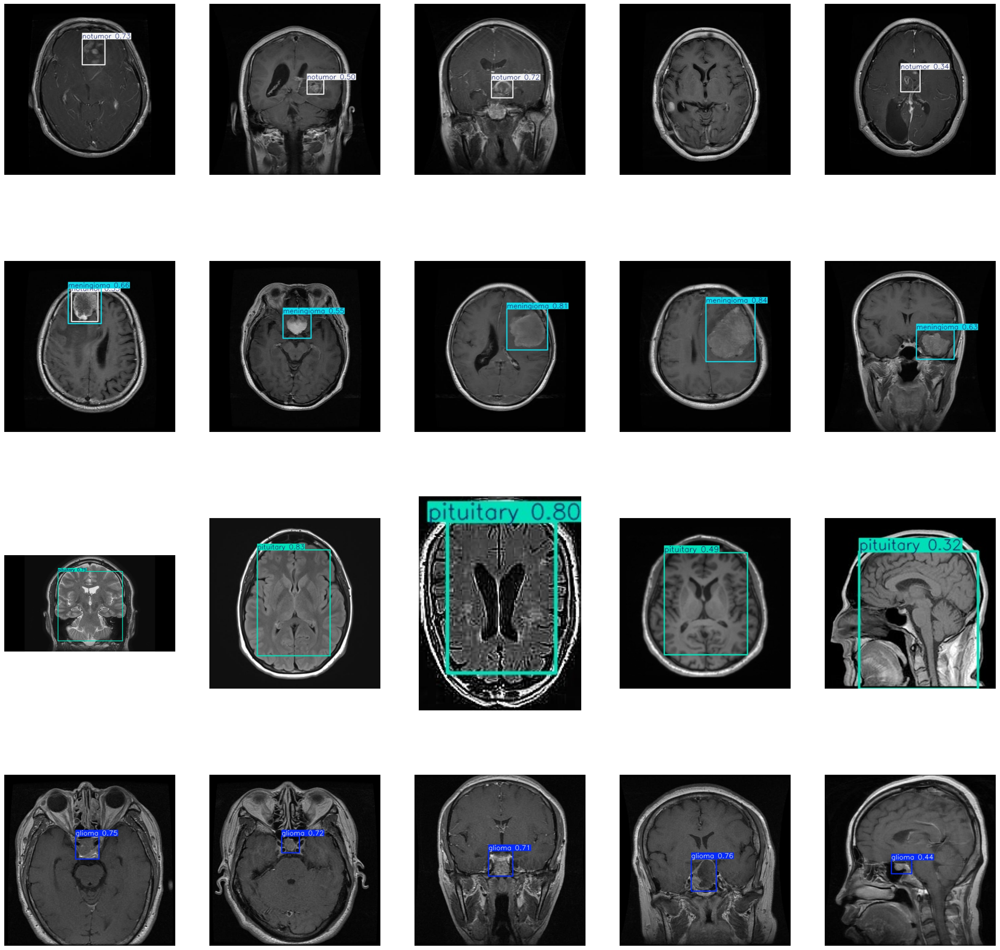

In [ ]:
dirs = ['/content/drive/MyDrive/brain_tumor_object_detection/inference_results/glioma_test_results/predict',
        '/content/drive/MyDrive/brain_tumor_object_detection/inference_results/meningioma_test_results/predict',
        '/content/drive/MyDrive/brain_tumor_object_detection/inference_results/notumor_test_results/predict',
        '/content/drive/MyDrive/brain_tumor_object_detection/inference_results/pituitary_test_results/predict']

all_images = []
for directory in dirs:
    random_images = get_random_images_from_dir(directory, num_images=5)
    all_images.extend(random_images)

display_images(all_images)
# Collects random prediction result images from each tumor class directory and displays them together in a grid to visually compare YOLOv8’s detection performance across categories.

### Train yolo12s

In [ ]:
yolo_btd_model = YOLO('yolo12s.pt')  # Initialize the YOLOv8 Nano model using the configuration file 'yolov8n.yaml'

# Train the YOLOv8 model on the specified brain tumor dataset for 25 epochs
yolo_btd_model_results = yolo_btd_model.train(data='/content/drive/MyDrive/brain_tumor_object_detection/brain_tumor_dataset.yaml', epochs=40, batch=32, optimizer= "Adamax",  momentum=0.937, verbose=True,patience=10 )

Ultralytics 8.3.230 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/brain_tumor_object_detection/brain_tumor_dataset.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=40, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo12s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=Adamax, overlap_mask=True,

Save model results to drive

In [ ]:
!mkdir -p /content/drive/MyDrive/brain_tumor_object_detection/yolo12s/ # Create a new directory in Google Drive to store the trained YOLOv8 model
!cp -r /content/runs/detect/train /content/drive/MyDrive/brain_tumor_object_detection/yolo12s/ # Copy the trained model files from the local Colab directory to the newly created folder in Google Drive

Test data evaluation

In [ ]:
from ultralytics import YOLO

model = YOLO('/content/drive/MyDrive/brain_tumor_object_detection/yolo12s/train/weights/best.pt') #load the trained model

metrics = model.val(
    data='/content/drive/MyDrive/brain_tumor_object_detection/brain_tumor_dataset.yaml',
    split='test',
    imgsz=320,
    conf=0.3,
    save_json=True
)

print(f"mAP@0.5: {metrics.box.map50:.4f}")
print(f"mAP@0.5–0.95: {metrics.box.map:.4f}")
print(f"Precision: {metrics.box.mp:.4f}")
print(f"Recall: {metrics.box.mr:.4f}") # Evaluate precision, recall and mean average precision on test set

Ultralytics 8.3.230 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12s summary (fused): 159 layers, 9,232,428 parameters, 0 gradients, 21.2 GFLOPs
val: Fast image access ✅ (ping: 0.7±0.2 ms, read: 0.1±0.0 MB/s, size: 25.8 KB)
val: Scanning /content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/glioma.cache... 329 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 329/329 434.2Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 21/21 4.4s/it 1:31
                   all        329        331      0.857      0.791      0.863      0.534
                glioma         94         94      0.932      0.872      0.929      0.468
            meningioma         83         83       0.92      0.831      0.902      0.585
               notumor         70         72      0.814      0.486      0.667      0.381
             pituitary         82         82      0.762      0.976    

In [ ]:
from ultralytics import YOLO

model = YOLO('/content/drive/MyDrive/brain_tumor_object_detection/yolo12s/train/weights/best.pt') #load the trained model

metrics = model.val(
    data='/content/drive/MyDrive/brain_tumor_object_detection/brain_tumor_dataset.yaml',
    split='test',
    imgsz=320,
    conf=0.3,
    save_json=True
)

print(f"mAP@0.5: {metrics.box.map50:.4f}")
print(f"mAP@0.5–0.95: {metrics.box.map:.4f}")
print(f"Precision: {metrics.box.mp:.4f}")
print(f"Recall: {metrics.box.mr:.4f}") # Evaluate precision, recall and mean average precision on test set

Ultralytics 8.3.233 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12s summary (fused): 159 layers, 9,232,428 parameters, 0 gradients, 21.2 GFLOPs
val: Fast image access ✅ (ping: 0.6±0.3 ms, read: 9.7±5.0 MB/s, size: 29.2 KB)
val: Scanning /content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/glioma.cache... 329 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 329/329 470.0Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 21/21 5.0it/s 4.2s
                   all        329        331      0.857      0.791      0.863      0.534
                glioma         94         94      0.932      0.872      0.929      0.468
            meningioma         83         83       0.92      0.831      0.902      0.585
               notumor         70         72      0.814      0.486      0.667      0.381
             pituitary         82         82      0.762      0.976    

View results plots

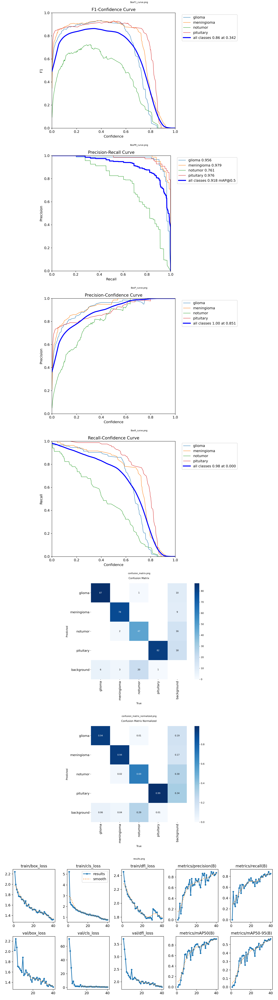

In [ ]:
image_paths = [
    '/content/drive/MyDrive/brain_tumor_object_detection/yolo12s/train/BoxF1_curve.png',
    '/content/drive/MyDrive/brain_tumor_object_detection/yolo12s/train/BoxPR_curve.png',
    '/content/drive/MyDrive/brain_tumor_object_detection/yolo12s/train/BoxP_curve.png',
    '/content/drive/MyDrive/brain_tumor_object_detection/yolo12s/train/BoxR_curve.png',
    '/content/drive/MyDrive/brain_tumor_object_detection/yolo12s/train/confusion_matrix.png',
    '/content/drive/MyDrive/brain_tumor_object_detection/yolo12s/train/confusion_matrix_normalized.png',
    '/content/drive/MyDrive/brain_tumor_object_detection/yolo12s/train/results.png',
]
plot_images(image_paths) # Specifies the file paths of YOLOv12 training result images and displays them using the previously defined function.

###Create predictions with bounding boxes

In [ ]:
def predict_results(test_images_dir, output_dir):
    model = YOLO('/content/drive/MyDrive/brain_tumor_object_detection/yolo12s/train/weights/best.pt')
    os.makedirs(output_dir, exist_ok=True)

    image_files = [f for f in os.listdir(test_images_dir) if f.lower().endswith('.jpg')]

    for image_file in image_files:
        image_path = os.path.join(test_images_dir, image_file)
        model.predict(
            image_path,
            save=True,
            imgsz=320,
            conf=0.3,
            project=output_dir,
            name='',
            exist_ok=True
        )
# Defines a function that loads the trained YOLOv12s model and generates predictions on all test images, saving the detected output images with bounding boxes to the specified output directory.


In [ ]:
from ultralytics import YOLO
glioma_test_dir = '/content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/glioma'
predict_results(glioma_test_dir, '/content/drive/MyDrive/brain_tumor_object_detection/inference_results_yolo12s/glioma_test_results')
# Loads the YOLOv8 model and runs the predict_results() function to perform tumor detection on glioma test images, saving the predicted outputs to the specified inference results folder.



image 1/1 /content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/glioma/Tr-gl_0080.jpg: 320x320 1 pituitary, 12.4ms
Speed: 12.0ms preprocess, 12.4ms inference, 2.0ms postprocess per image at shape (1, 3, 320, 320)
Results saved to /content/drive/MyDrive/brain_tumor_object_detection/inference_results_yolo12s/glioma_test_results/predict

image 1/1 /content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/glioma/Tr-gl_0082.jpg: 320x320 1 meningioma, 1 notumor, 273.9ms
Speed: 5.2ms preprocess, 273.9ms inference, 5.1ms postprocess per image at shape (1, 3, 320, 320)
Results saved to /content/drive/MyDrive/brain_tumor_object_detection/inference_results_yolo12s/glioma_test_results/predict

image 1/1 /content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/glioma/Tr-gl_0090.jpg: 320x320 2 notumors, 16.1ms
Speed: 1.1ms preprocess, 16.1ms inference, 1.6ms postprocess per image at shape (1, 3, 320

In [ ]:
from ultralytics import YOLO
meningioma_test_dir = '/content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/meningioma'
predict_results(meningioma_test_dir, '/content/drive/MyDrive/brain_tumor_object_detection/inference_results_yolo12s/meningioma_test_results')
# Loads the YOLOv8 model and runs the predict_results() function to perform tumor detection on glioma test images, saving the predicted outputs to the specified inference results folder.



image 1/1 /content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/meningioma/Tr-me_0010.jpg: 320x320 1 meningioma, 13.0ms
Speed: 1.2ms preprocess, 13.0ms inference, 1.5ms postprocess per image at shape (1, 3, 320, 320)
Results saved to /content/drive/MyDrive/brain_tumor_object_detection/inference_results_yolo12s/meningioma_test_results/predict

image 1/1 /content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/meningioma/Tr-me_0017.jpg: 320x320 1 meningioma, 22.9ms
Speed: 1.7ms preprocess, 22.9ms inference, 2.8ms postprocess per image at shape (1, 3, 320, 320)
Results saved to /content/drive/MyDrive/brain_tumor_object_detection/inference_results_yolo12s/meningioma_test_results/predict

image 1/1 /content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/meningioma/Tr-me_0018.jpg: 320x320 1 meningioma, 18.0ms
Speed: 1.1ms preprocess, 18.0ms inference, 2.8ms postprocess per image at shape (

In [ ]:
meningioma_test_dir = '/content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/meningioma'
predict_results(meningioma_test_dir, '/content/drive/MyDrive/brain_tumor_object_detection/inference_results_yolo12s/meningioma_test_results')
# Loads the YOLOv8 model and runs the predict_results() function to perform tumor detection on glioma test images, saving the predicted outputs to the specified inference results folder.


In [ ]:
notumor_test_dir = '/content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/notumor'
predict_results(notumor_test_dir, '/content/drive/MyDrive/brain_tumor_object_detection/inference_results_yolo12s/notumor_test_results')
# Loads the YOLOv8 model and runs the predict_results() function to perform tumor detection on notumor test images, saving the predicted outputs to the specified inference results folder.


image 1/1 /content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/notumor/Tr-no_0016.jpg: 320x320 1 pituitary, 13.2ms
Speed: 1.2ms preprocess, 13.2ms inference, 1.6ms postprocess per image at shape (1, 3, 320, 320)
Results saved to /content/drive/MyDrive/brain_tumor_object_detection/inference_results_yolo12s/notumor_test_results/predict

image 1/1 /content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/notumor/Tr-no_0017.jpg: 320x320 1 pituitary, 26.6ms
Speed: 2.0ms preprocess, 26.6ms inference, 2.3ms postprocess per image at shape (1, 3, 320, 320)
Results saved to /content/drive/MyDrive/brain_tumor_object_detection/inference_results_yolo12s/notumor_test_results/predict

image 1/1 /content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/notumor/Tr-no_0027.jpg: 320x320 1 pituitary, 18.1ms
Speed: 1.3ms preprocess, 18.1ms inference, 2.1ms postprocess per image at shape (1, 3, 320, 320)
Re

In [ ]:
pituitary_test_dir = '/content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/pituitary'
predict_results(pituitary_test_dir, '/content/drive/MyDrive/brain_tumor_object_detection/inference_results_yolo12s/pituitary_test_results')
#Loads the YOLOv8 model and runs the predict_results() function to perform tumor detection on pituitary test images, saving the predicted outputs to the specified inference results folder.


image 1/1 /content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/pituitary/Tr-pi_0015.jpg: 320x320 2 gliomas, 13.6ms
Speed: 1.1ms preprocess, 13.6ms inference, 1.6ms postprocess per image at shape (1, 3, 320, 320)
Results saved to /content/drive/MyDrive/brain_tumor_object_detection/inference_results_yolo12s/pituitary_test_results/predict

image 1/1 /content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/pituitary/Tr-pi_0050.jpg: 320x320 1 glioma, 24.9ms
Speed: 1.6ms preprocess, 24.9ms inference, 2.7ms postprocess per image at shape (1, 3, 320, 320)
Results saved to /content/drive/MyDrive/brain_tumor_object_detection/inference_results_yolo12s/pituitary_test_results/predict

image 1/1 /content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/pituitary/Tr-pi_0052.jpg: 320x320 1 glioma, 1 meningioma, 17.7ms
Speed: 1.1ms preprocess, 17.7ms inference, 1.6ms postprocess per image at shape (1,

###Train YOLO12m

In [ ]:
yolo_btd_model = YOLO('yolo12m.pt')  # Initialize the YOLOv8 Nano model using the configuration file 'yolov8n.yaml'

# Train the YOLOv8 model on the specified brain tumor dataset for 25 epochs
yolo_btd_model_results = yolo_btd_model.train(data='/content/drive/MyDrive/brain_tumor_object_detection/data/brain_tumor_object_detection/brain_tumor_dataset.yaml', epochs=40, batch=10, optimizer= "Adamax",  momentum=0.937, verbose=True,patience=10 )

Ultralytics 8.3.230 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=10, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/brain_tumor_object_detection/data/brain_tumor_object_detection/brain_tumor_dataset.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=40, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo12m.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train5, nbs=64, nms=False, opset=None, optimize=False, o

Save model results to drive

In [ ]:
!mkdir -p /content/drive/MyDrive/brain_tumor_object_detection/yolo12mnew/ # Create a new directory in Google Drive to store the trained YOLOv8 model
!cp -r /content/runs/detect/train5 /content/drive/MyDrive/brain_tumor_object_detection/yolo12mnew/ # Copy the trained model files from the local Colab directory to the newly created folder in Google Drive

Save model results to drive

In [ ]:
from ultralytics import YOLO

model = YOLO('/content/drive/MyDrive/brain_tumor_object_detection/yolo12m/train5/weights/best.pt') #load the trained model

metrics = model.val(
    data='/content/brain_tumor_dataset.yaml',
    split='test',
    imgsz=320,
    conf=0.3,
    save_json=True
)

print(f"mAP@0.5: {metrics.box.map50:.4f}")
print(f"mAP@0.5–0.95: {metrics.box.map:.4f}")
print(f"Precision: {metrics.box.mp:.4f}")
print(f"Recall: {metrics.box.mr:.4f}") # Evaluate precision, recall and mean average precision on test set

Ultralytics 8.3.230 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12m summary (fused): 169 layers, 20,107,996 parameters, 0 gradients, 67.1 GFLOPs
val: Fast image access ✅ (ping: 0.4±0.1 ms, read: 9.6±3.1 MB/s, size: 30.3 KB)
val: Scanning /content/drive/MyDrive/brain_tumor_object_detection/data/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/glioma... 329 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 329/329 133.3it/s 2.5s
val: New cache created: /content/drive/MyDrive/brain_tumor_object_detection/data/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/glioma.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 21/21 4.8it/s 4.4s
                   all        329        331      0.869      0.791      0.858      0.538
                glioma         94         94      0.943      0.884      0.931      0.483
            meningioma         83         83      0.911    

### Train YOLO11n

In [ ]:
yolo_btd_model = YOLO('yolo11n.pt')  # Initialize the YOLOv8 Nano model using the configuration file 'yolov8n.yaml'

# Train the YOLOv8 model on the specified brain tumor dataset for 25 epochs
yolo_btd_model_results = yolo_btd_model.train(data='/content/drive/MyDrive/brain_tumor_object_detection/brain_tumor_dataset.yaml', epochs=40, batch=32, optimizer= "Adamax",  momentum=0.937, verbose=True,patience=10 )

Ultralytics 8.3.230 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/brain_tumor_object_detection/brain_tumor_dataset.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=40, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train4, nbs=64, nms=False, opset=None, optimize=False, optimizer=Adamax, overlap_mask=True

Save model results to drive

In [ ]:
!mkdir -p /content/drive/MyDrive/brain_tumor_object_detection/yolo11n/ # Create a new directory in Google Drive to store the trained YOLOv8 model
!cp -r /content/runs/detect/train4 /content/drive/MyDrive/brain_tumor_object_detection/yolo11n/ # Copy the trained model files from the local Colab directory to the newly created folder in Google Drive

In [ ]:
from ultralytics import YOLO

model = YOLO('/content/drive/MyDrive/brain_tumor_object_detection/yolo11n/train4/weights/best.pt') #load the trained model

metrics = model.val(
    data='/content/drive/MyDrive/brain_tumor_object_detection/brain_tumor_dataset.yaml',
    split='test',
    imgsz=320,
    conf=0.3,
    save_json=True
)

print(f"mAP@0.5: {metrics.box.map50:.4f}")
print(f"mAP@0.5–0.95: {metrics.box.map:.4f}")
print(f"Precision: {metrics.box.mp:.4f}")
print(f"Recall: {metrics.box.mr:.4f}") # Evaluate precision, recall and mean average precision on test set

Ultralytics 8.3.232 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,582,932 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 0.5±0.1 ms, read: 0.1±0.0 MB/s, size: 21.1 KB)
val: Scanning /content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/glioma.cache... 329 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 329/329 201.6Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 21/21 3.7s/it 1:17
                   all        329        331      0.859      0.885      0.915      0.584
                glioma         94         94      0.885      0.936      0.957      0.543
            meningioma         83         83       0.93      0.964      0.977      0.636
               notumor         70         72      0.773      0.653      0.755      0.431
             pituitary         82         82      0.847      0.988      

Create Predictions

In [ ]:
def predict_results(test_images_dir, output_dir):
    model = YOLO('/content/drive/MyDrive/brain_tumor_object_detection/yolo11n/train4/weights/best.pt')
    os.makedirs(output_dir, exist_ok=True)

    image_files = [f for f in os.listdir(test_images_dir) if f.lower().endswith('.jpg')]

    for image_file in image_files:
        image_path = os.path.join(test_images_dir, image_file)
        model.predict(
            image_path,
            save=True,
            imgsz=320,
            conf=0.3,
            project=output_dir,
            name='',
            exist_ok=True
        )
# Defines a function that loads the trained model and generates predictions on all test images, saving the detected output images with bounding boxes to the specified output directory.

from ultralytics import YOLO
glioma_test_dir = '/content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/glioma'
predict_results(glioma_test_dir, '/content/drive/MyDrive/brain_tumor_object_detection/inference_results_yolo11n/glioma_test_results')
# Loads the YOLOv8 model and runs the predict_results() function to perform tumor detection on glioma test images, saving the predicted outputs to the specified inference results folder.

meningioma_test_dir = '/content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/meningioma'
predict_results(meningioma_test_dir, '/content/drive/MyDrive/brain_tumor_object_detection/inference_results_yolo11n/meningioma_test_results')
# Loads the YOLOv8 model and runs the predict_results() function to perform tumor detection on glioma test images, saving the predicted outputs to the specified inference results folder.

pituitary_test_dir = '/content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/pituitary'
predict_results(pituitary_test_dir, '/content/drive/MyDrive/brain_tumor_object_detection/inference_results_yolo11n/pituitary_test_results')
# Loads the YOLOv8 model and runs the predict_results() function to perform tumor detection on glioma test images, saving the predicted outputs to the specified inference results folder.

notumor_test_dir = '/content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/notumor'
predict_results(notumor_test_dir, '/content/drive/MyDrive/brain_tumor_object_detection/inference_results_yolo11n/notumor_test_results')
# Loads the YOLOv8 model and runs the predict_results() function to perform tumor detection on glioma test images, saving the predicted outputs to the specified inference results folder.




image 1/1 /content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/glioma/Tr-gl_0080.jpg: 320x320 1 notumor, 8.7ms
Speed: 1.5ms preprocess, 8.7ms inference, 1.5ms postprocess per image at shape (1, 3, 320, 320)
Results saved to /content/drive/MyDrive/brain_tumor_object_detection/inference_results_yolo11n/glioma_test_results/predict

image 1/1 /content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/glioma/Tr-gl_0082.jpg: 320x320 2 notumors, 30.7ms
Speed: 1.3ms preprocess, 30.7ms inference, 2.9ms postprocess per image at shape (1, 3, 320, 320)
Results saved to /content/drive/MyDrive/brain_tumor_object_detection/inference_results_yolo11n/glioma_test_results/predict

image 1/1 /content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/glioma/Tr-gl_0090.jpg: 320x320 1 notumor, 23.9ms
Speed: 5.5ms preprocess, 23.9ms inference, 4.2ms postprocess per image at shape (1, 3, 320, 320)
Results saved 

###Train YOLO11s

In [ ]:
yolo_btd_model = YOLO('yolo11s.pt')  # Initialize the YOLOv8 Nano model using the configuration file 'yolov8n.yaml'

# Train the YOLOv8 model on the specified brain tumor dataset for 25 epochs
yolo_btd_model_results = yolo_btd_model.train(data='/content/drive/MyDrive/brain_tumor_object_detection/brain_tumor_dataset.yaml', epochs=40, batch=32, optimizer= "Adamax",  momentum=0.937, verbose=True,patience=10 )

Ultralytics 8.3.230 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/brain_tumor_object_detection/brain_tumor_dataset.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=40, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train5, nbs=64, nms=False, opset=None, optimize=False, optimizer=Adamax, overlap_mask=True

Save model results to drive

In [ ]:
!mkdir -p /content/drive/MyDrive/brain_tumor_object_detection/yolo11s/ # Create a new directory in Google Drive to store the trained YOLOv8 model
!cp -r /content/runs/detect/train5 /content/drive/MyDrive/brain_tumor_object_detection/yolo11s/ # Copy the trained model files from the local Colab directory to the newly created folder in Google Drive

Evaluation on test data

In [ ]:
from ultralytics import YOLO

model = YOLO('/content/drive/MyDrive/brain_tumor_object_detection/yolo11s/train5/weights/best.pt') #load the trained model

metrics = model.val(
    data='/content/drive/MyDrive/brain_tumor_object_detection/brain_tumor_dataset.yaml',
    split='test',
    conf=0.3,
    save_json=True
)

print(f"mAP@0.5: {metrics.box.map50:.4f}")
print(f"mAP@0.5–0.95: {metrics.box.map:.4f}")
print(f"Precision: {metrics.box.mp:.4f}")
print(f"Recall: {metrics.box.mr:.4f}") # Evaluate precision, recall and mean average precision on test set

Ultralytics 8.3.232 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLO11s summary (fused): 100 layers, 9,414,348 parameters, 0 gradients, 21.3 GFLOPs
val: Fast image access ✅ (ping: 0.4±0.1 ms, read: 14.2±5.6 MB/s, size: 23.4 KB)
val: Scanning /content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/glioma.cache... 329 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 329/329 184.6Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 21/21 5.7it/s 3.7s
                   all        329        331      0.895       0.85      0.913      0.583
                glioma         94         94      0.941      0.915      0.964      0.524
            meningioma         83         83      0.916      0.916      0.964      0.657
               notumor         70         72      0.866      0.583      0.748      0.432
             pituitary         82         82      0.857      0.988    

Create Predictions

In [ ]:
def predict_results(test_images_dir, output_dir):
    model = YOLO('/content/drive/MyDrive/brain_tumor_object_detection/yolo11s/train5/weights/best.pt')
    os.makedirs(output_dir, exist_ok=True)

    image_files = [f for f in os.listdir(test_images_dir) if f.lower().endswith('.jpg')]

    for image_file in image_files:
        image_path = os.path.join(test_images_dir, image_file)
        model.predict(
            image_path,
            data='/content/drive/MyDrive/brain_tumor_object_detection/brain_tumor_dataset.yaml',

            save=True,
            imgsz=320,
            conf=0.3,
            project=output_dir,
            name='',
            exist_ok=True
        )
# Defines a function that loads the trained model and generates predictions on all test images, saving the detected output images with bounding boxes to the specified output directory.

from ultralytics import YOLO
glioma_test_dir = '/content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/glioma'
predict_results(glioma_test_dir, '/content/drive/MyDrive/brain_tumor_object_detection/inference_results_yolo11s/glioma_test_results')
# Loads the YOLOv8 model and runs the predict_results() function to perform tumor detection on glioma test images, saving the predicted outputs to the specified inference results folder.

meningioma_test_dir = '/content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/meningioma'
predict_results(meningioma_test_dir, '/content/drive/MyDrive/brain_tumor_object_detection/inference_results_yolo11s/meningioma_test_results')
# Loads the YOLOv8 model and runs the predict_results() function to perform tumor detection on glioma test images, saving the predicted outputs to the specified inference results folder.

pituitary_test_dir = '/content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/pituitary'
predict_results(pituitary_test_dir, '/content/drive/MyDrive/brain_tumor_object_detection/inference_results_yolo11s/pituitary_test_results')
# Loads the YOLOv8 model and runs the predict_results() function to perform tumor detection on glioma test images, saving the predicted outputs to the specified inference results folder.

notumor_test_dir = '/content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/notumor'
predict_results(notumor_test_dir, '/content/drive/MyDrive/brain_tumor_object_detection/inference_results_yolo11s/notumor_test_results')
# Loads the YOLOv8 model and runs the predict_results() function to perform tumor detection on glioma test images, saving the predicted outputs to the specified inference results folder.



image 1/1 /content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/glioma/Tr-gl_0080.jpg: 320x320 (no detections), 10.0ms
Speed: 2.9ms preprocess, 10.0ms inference, 0.5ms postprocess per image at shape (1, 3, 320, 320)
Results saved to /content/drive/MyDrive/brain_tumor_object_detection/inference_results_yolo11s/glioma_test_results/predict

image 1/1 /content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/glioma/Tr-gl_0082.jpg: 320x320 1 notumor, 10.9ms
Speed: 1.4ms preprocess, 10.9ms inference, 1.7ms postprocess per image at shape (1, 3, 320, 320)
Results saved to /content/drive/MyDrive/brain_tumor_object_detection/inference_results_yolo11s/glioma_test_results/predict

image 1/1 /content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/glioma/Tr-gl_0090.jpg: 320x320 1 notumor, 13.2ms
Speed: 0.9ms preprocess, 13.2ms inference, 2.2ms postprocess per image at shape (1, 3, 320, 320)
Results

###Train YOLO11m

In [ ]:
yolo_btd_model = YOLO('yolo11m.pt')  # Initialize the YOLOv8 Nano model using the configuration file 'yolov8n.yaml'

# Train the YOLOv8 model on the specified brain tumor dataset for 25 epochs
yolo_btd_model_results = yolo_btd_model.train(data='/content/drive/MyDrive/brain_tumor_object_detection/brain_tumor_dataset.yaml', epochs=40, batch=8, optimizer= "Adamax",  momentum=0.937, verbose=True,patience=10 )

Ultralytics 8.3.230 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/brain_tumor_object_detection/brain_tumor_dataset.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=40, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11m.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=Adamax, overlap_mask=True, 

Save model results to drive

In [ ]:
!mkdir -p /content/drive/MyDrive/brain_tumor_object_detection/yolo11m/ # Create a new directory in Google Drive to store the trained YOLOv8 model
!cp -r /content/runs/detect/train /content/drive/MyDrive/brain_tumor_object_detection/yolo11m/ # Copy the trained model files from the local Colab directory to the newly created folder in Google Drive

Test data evaluation

In [ ]:
from ultralytics import YOLO

model = YOLO('/content/drive/MyDrive/brain_tumor_object_detection/yolo11m/train/weights/best.pt') #load the trained model

metrics = model.val(
    data='/content/drive/MyDrive/brain_tumor_object_detection/brain_tumor_dataset.yaml',
    split='test',
    imgsz=320,
    conf=0.3,
    save_json=True
)

print(f"mAP@0.5: {metrics.box.map50:.4f}")
print(f"mAP@0.5–0.95: {metrics.box.map:.4f}")
print(f"Precision: {metrics.box.mp:.4f}")
print(f"Recall: {metrics.box.mr:.4f}") # Evaluate precision, recall and mean average precision on test set

Ultralytics 8.3.232 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLO11m summary (fused): 125 layers, 20,033,116 parameters, 0 gradients, 67.7 GFLOPs
val: Fast image access ✅ (ping: 1.1±0.8 ms, read: 6.7±3.3 MB/s, size: 24.9 KB)
val: Scanning /content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/glioma.cache... 329 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 329/329 432.4Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 21/21 5.0it/s 4.2s
                   all        329        331       0.88      0.805      0.857      0.537
                glioma         94         94      0.952      0.862      0.916      0.496
            meningioma         83         83      0.939       0.88      0.919      0.589
               notumor         70         72       0.74      0.554       0.64      0.341
             pituitary         82         82       0.89      0.927    

**Reasoning**:
The previous attempt to load the model failed due to an incorrect path. I will correct the path as specified in the instructions and try loading the model again.



In [ ]:
from ultralytics import YOLO

# Load the pre-trained yolo12n model with the corrected path
yolo12n_model = YOLO('/content/drive/MyDrive/brain_tumor_object_detection/yolov12n/train9/weights/best.pt')

print("YOLOv12n model loaded successfully.")

YOLOv12n model loaded successfully.


**Reasoning**:
The YOLOv12n model has been loaded successfully. Now, I will evaluate the loaded model on the test dataset as per the task requirements, calculating mAP@0.5, mAP@0.5-0.95, Precision, and Recall, and provide a clarification regarding DICE vs. IoU metrics.



In [ ]:
metrics = yolo12n_model.val(
    data='/content/brain_tumor_dataset.yaml',
    split='test',
    imgsz=320,
    conf=0.3,
    save_json=True
)

print("\n--- Evaluation Results for YOLOv12n ---")
print(f"mAP@0.5: {metrics.box.map50:.4f}")
print(f"mAP@0.5–0.95: {metrics.box.map:.4f}")
print(f"Precision: {metrics.box.mp:.4f}")
print(f"Recall: {metrics.box.mr:.4f}")

print("\nClarification on IoU vs. DICE for object detection:")
print("mAP@0.5 and mAP@0.5-0.95 are the standard Intersection over Union (IoU) based metrics for bounding box object detection, reflecting the accuracy of object localization and classification. DICE (Sørensen–Dice coefficient) is primarily used in image segmentation tasks to measure the similarity between two segmented images or regions, not typically for bounding box detection results.")

Ultralytics 8.3.232 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12n summary (fused): 159 layers, 2,557,508 parameters, 0 gradients, 6.3 GFLOPs


FileNotFoundError: '/content/brain_tumor_dataset.yaml' does not exist

**Reasoning**:
The previous evaluation step failed because the dataset YAML file was not found. I will re-create the `brain_tumor_dataset.yaml` file in the `/content/` directory to ensure it is available for evaluation, as it was likely not persistent across sessions or was inadvertently deleted.



In [ ]:
yaml_text = """\
path: /content/drive/MyDrive/brain_tumor_object_detection/data/brain_tumor_object_detection/data/Brain Tumor labeled dataset/

train: /content/drive/MyDrive/brain_tumor_object_detection/data/brain_tumor_object_detection/data/Brain Tumor labeled dataset/train
val: /content/drive/MyDrive/brain_tumor_object_detection/data/brain_tumor_object_detection/data/Brain Tumor labeled dataset/val
test: /content/drive/MyDrive/brain_tumor_object_detection/data/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test

names:
  0: glioma
  1: meningioma
  2: notumor
  3: pituitary
"""

# Save YAML file
yaml_path = "/content/brain_tumor_dataset.yaml"
with open(yaml_path, "w") as f:
    f.write(yaml_text)

print("✅ YAML file saved at:", yaml_path)
!cat /content/brain_tumor_dataset.yaml

✅ YAML file saved at: /content/brain_tumor_dataset.yaml
path: /content/drive/MyDrive/brain_tumor_object_detection/data/brain_tumor_object_detection/data/Brain Tumor labeled dataset/

train: /content/drive/MyDrive/brain_tumor_object_detection/data/brain_tumor_object_detection/data/Brain Tumor labeled dataset/train
val: /content/drive/MyDrive/brain_tumor_object_detection/data/brain_tumor_object_detection/data/Brain Tumor labeled dataset/val
test: /content/drive/MyDrive/brain_tumor_object_detection/data/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test

names:
  0: glioma
  1: meningioma
  2: notumor
  3: pituitary


# Task
Load the pre-trained `yolo11s` model from '/content/drive/MyDrive/brain_tumor_object_detection/yolo11s/train5/weights/best.pt' using the Ultralytics YOLO library.

## Load YOLO11s Model

### Subtask:
Load the pre-trained `yolo11s` model from '/content/drive/MyDrive/brain_tumor_object_detection/yolo11s/train5/weights/best.pt' using the Ultralytics YOLO library.


**Reasoning**:
The subtask is to load the pre-trained `yolo11s` model. I will use the `ultralytics` library's `YOLO` class to load the model from the specified path. This is a direct implementation of the first two instructions.



In [ ]:
from ultralytics import YOLO

# Load the pre-trained yolo11s model
yolo11s_model = YOLO('/content/drive/MyDrive/brain_tumor_object_detection/yolo11s/train5/weights/best.pt')

print("YOLO11s model loaded successfully.")

YOLO11s model loaded successfully.


# Task
Run the `yolo11s` model validation on the test dataset located at `/content/drive/MyDrive/brain_tumor_object_detection/brain_tumor_dataset.yaml` to generate the Precision-Recall (PR) curve and save the results.

## Load YOLO11n Model




In [ ]:
from ultralytics import YOLO

# Load the pre-trained yolo11s model
yolo11n_model = YOLO('/content/drive/MyDrive/brain_tumor_object_detection/yolo11n/train4/weights/best.pt')

print("YOLO11n model loaded successfully.")

YOLO11n model loaded successfully.


## Run YOLO11s Model Validation to Generate PR Curve




In [ ]:
metrics = yolo11s_model.val(
    data='/content/drive/MyDrive/brain_tumor_object_detection/brain_tumor_dataset.yaml',
    split='test',
    imgsz=320,
    conf=0.3,
    save_json=True
)

print("\n--- Evaluation Results for YOLO11s ---")
print(f"mAP@0.5: {metrics.box.map50:.4f}")
print(f"mAP@0.5\u20130.95: {metrics.box.map:.4f}")
print(f"Precision: {metrics.box.mp:.4f}")
print(f"Recall: {metrics.box.mr:.4f}")

Ultralytics 8.3.233 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLO11s summary (fused): 100 layers, 9,414,348 parameters, 0 gradients, 21.3 GFLOPs
val: Fast image access ✅ (ping: 0.6±0.2 ms, read: 0.1±0.0 MB/s, size: 26.2 KB)
val: Scanning /content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/glioma.cache... 329 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 329/329 298.8Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 21/21 4.0s/it 1:23
                   all        329        331      0.895       0.85      0.913      0.582
                glioma         94         94      0.941      0.915      0.964      0.524
            meningioma         83         83      0.916      0.916      0.964      0.657
               notumor         70         72      0.866      0.583      0.748      0.432
             pituitary         82         82      0.857      0.988     

## Display YOLO11s PR Curve

### Subtask:
Locate and display the generated Precision-Recall (PR) curve image from the validation run's output directory. This will allow for visual inspection of the model's performance on the test data.


**Reasoning**:
The `plot_images` function was not defined in the current execution context, leading to a `NameError`. I need to re-define the function and then call it with the specified image paths to display the PR curve.



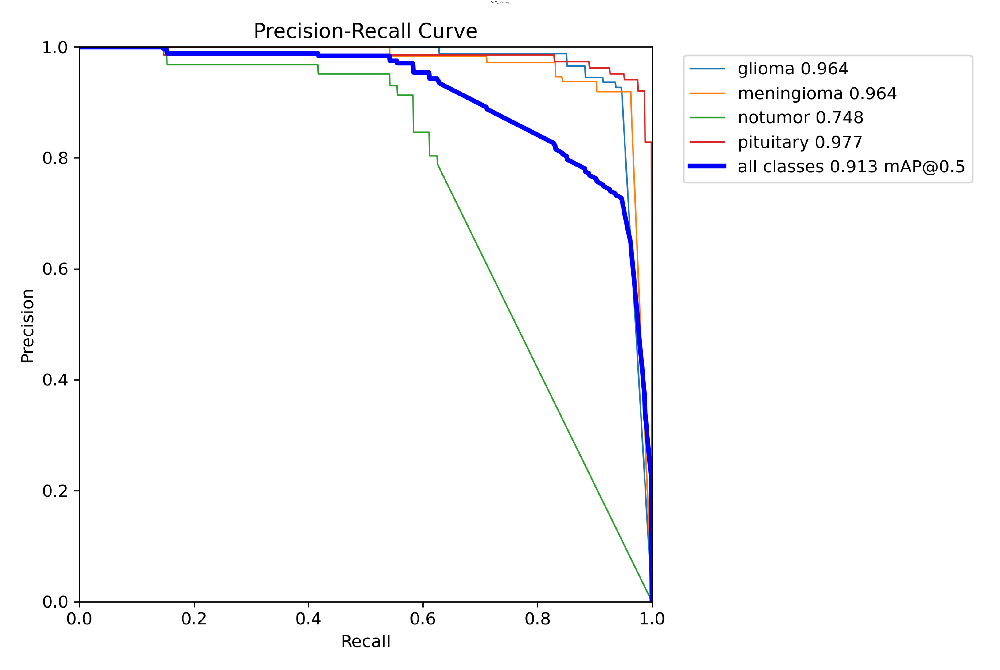

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

def plot_images(image_paths):
    fig, axes = plt.subplots(len(image_paths), 1, figsize=(80, 80))

    # Handle case where only one image is passed, axes would not be an array
    if len(image_paths) == 1:
        axes = [axes] # Make it a list so we can iterate consistently

    for i, ax in enumerate(axes):
        image_path = image_paths[i]
        img = mpimg.imread(image_path)
        ax.imshow(img)
        ax.axis('off')
        ax.set_title(os.path.basename(image_path))

    plt.tight_layout()
    plt.show()

image_paths = [
    '/content/runs/detect/val2/BoxPR_curve.png'
]
plot_images(image_paths)

In [ ]:
metrics = yolo11n_model.val(
    data='/content/drive/MyDrive/brain_tumor_object_detection/brain_tumor_dataset.yaml',
    split='test',
    imgsz=320,
    conf=0.3,
    save_json=True
)

print("\n--- Evaluation Results for YOLO11n ---")
print(f"mAP@0.5: {metrics.box.map50:.4f}")
print(f"mAP@0.5\u20130.95: {metrics.box.map:.4f}")
print(f"Precision: {metrics.box.mp:.4f}")
print(f"Recall: {metrics.box.mr:.4f}")

Ultralytics 8.3.233 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,582,932 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 0.5±0.2 ms, read: 10.6±8.1 MB/s, size: 16.9 KB)
val: Scanning /content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/glioma.cache... 329 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 329/329 468.9Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 21/21 6.5it/s 3.2s
                   all        329        331      0.859      0.885      0.915      0.583
                glioma         94         94      0.885      0.936      0.957      0.543
            meningioma         83         83       0.93      0.964      0.977      0.636
               notumor         70         72      0.773      0.653      0.755      0.431
             pituitary         82         82      0.847      0.988     

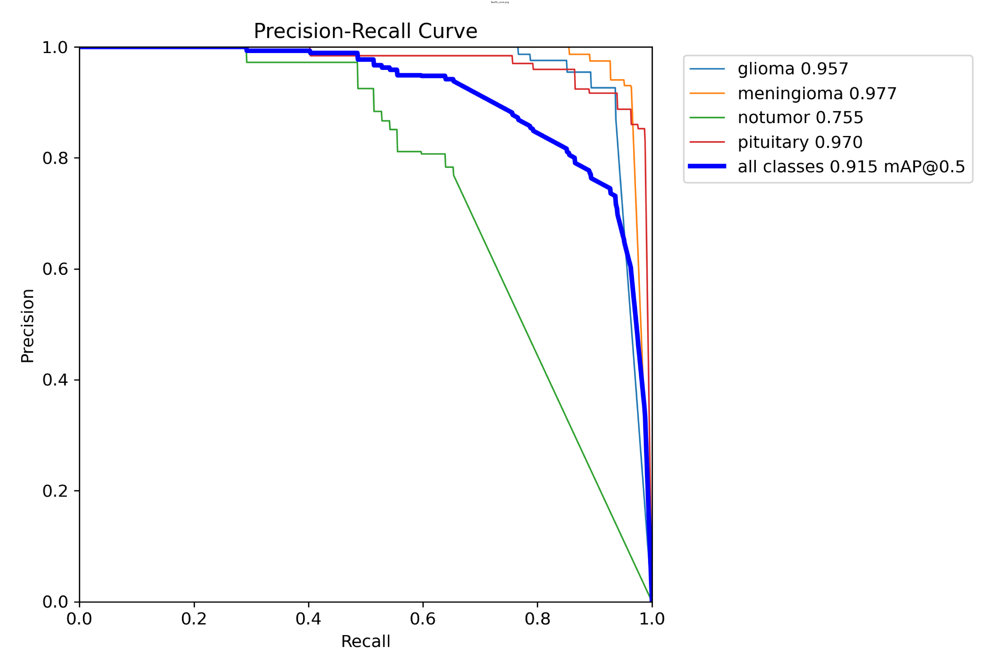

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

def plot_images(image_paths):
    fig, axes = plt.subplots(len(image_paths), 1, figsize=(80, 80))

    # Handle case where only one image is passed, axes would not be an array
    if len(image_paths) == 1:
        axes = [axes] # Make it a list so we can iterate consistently

    for i, ax in enumerate(axes):
        image_path = image_paths[i]
        img = mpimg.imread(image_path)
        ax.imshow(img)
        ax.axis('off')
        ax.set_title(os.path.basename(image_path))

    plt.tight_layout()
    plt.show()

image_paths = [
    '/content/runs/detect/val3/BoxPR_curve.png'
]
plot_images(image_paths)

# Task
## Generate and Display YOLO11n Confusion Matrix

### Subtask:
Locate and display the normalized confusion matrix image (`confusion_matrix_normalized.png`) from the YOLO11n validation run's output directory. This will allow for visual inspection of the model's classification performance on the test data.

### Reasoning:
The `yolo11n_model.val()` function, executed previously, saves various plots including the normalized confusion matrix to its output directory. I need to identify this directory and then use the `plot_images` function to display the `confusion_matrix_normalized.png` file. Based on the previous output, the results for YOLO11n were saved to `/content/runs/detect/val3`.



## Load YOLO11n Model

### Subtask:
Load the pre-trained `yolo11n` model from '/content/drive/MyDrive/brain_tumor_object_detection/yolo11n/train4/weights/best.pt' using the Ultralytics YOLO library.


**Reasoning**:
The subtask is to load the pre-trained `yolo11n` model. I will use the `ultralytics` library's `YOLO` class to load the model from the specified path and print a confirmation message.



In [ ]:
from ultralytics import YOLO

# Load the pre-trained yolo11n model
yolo11n_model = YOLO('/content/drive/MyDrive/brain_tumor_object_detection/yolo11n/train4/weights/best.pt')

print("YOLO11n model loaded successfully.")

YOLO11n model loaded successfully.


## Load YOLO11n Model

### Subtask:
Load the pre-trained `yolo11n` model from '/content/drive/MyDrive/brain_tumor_object_detection/yolo11n/train4/weights/best.pt' using the Ultralytics YOLO library.

#### Instructions
1. Import the `YOLO` class from the `ultralytics` library.
2. Instantiate a `YOLO` object by passing the model path '/content/drive/MyDrive/brain_tumor_object_detection/yolo11n/train4/weights/best.pt' to its constructor. Assign the loaded model to a variable named `yolo11n_model`.
3. Print a message confirming that the 'YOLO11n model loaded successfully.'

## Load YOLO11n Model

### Subtask:
Load the pre-trained `yolo11n` model from '/content/drive/MyDrive/brain_tumor_object_detection/yolo11n/train4/weights/best.pt' using the Ultralytics YOLO library.

#### Instructions
1. Import the `YOLO` class from the `ultralytics` library.
2. Instantiate a `YOLO` object by passing the model path '/content/drive/MyDrive/brain_tumor_object_detection/yolo11n/train4/weights/best.pt' to its constructor. Assign the loaded model to a variable named `yolo11n_model`.
3. Print a message confirming that the 'YOLO11n model loaded successfully.'

**Reasoning**:
A new markdown block has been added to provide context for loading the YOLO11n model. Now, I will generate the code to load the YOLO11n model as described in the subtask instructions.



In [ ]:
from ultralytics import YOLO

# Load the pre-trained yolo11n model
yolo11n_model = YOLO('/content/drive/MyDrive/brain_tumor_object_detection/yolo11n/train4/weights/best.pt')

print("YOLO11n model loaded successfully.")

YOLO11n model loaded successfully.


**Reasoning**:
The subtask is to display the normalized confusion matrix for the YOLO11n model. Based on the previous output, this image should be located in '/content/runs/detect/val3/confusion_matrix_normalized.png'. I will use the previously defined `plot_images` function to display it.



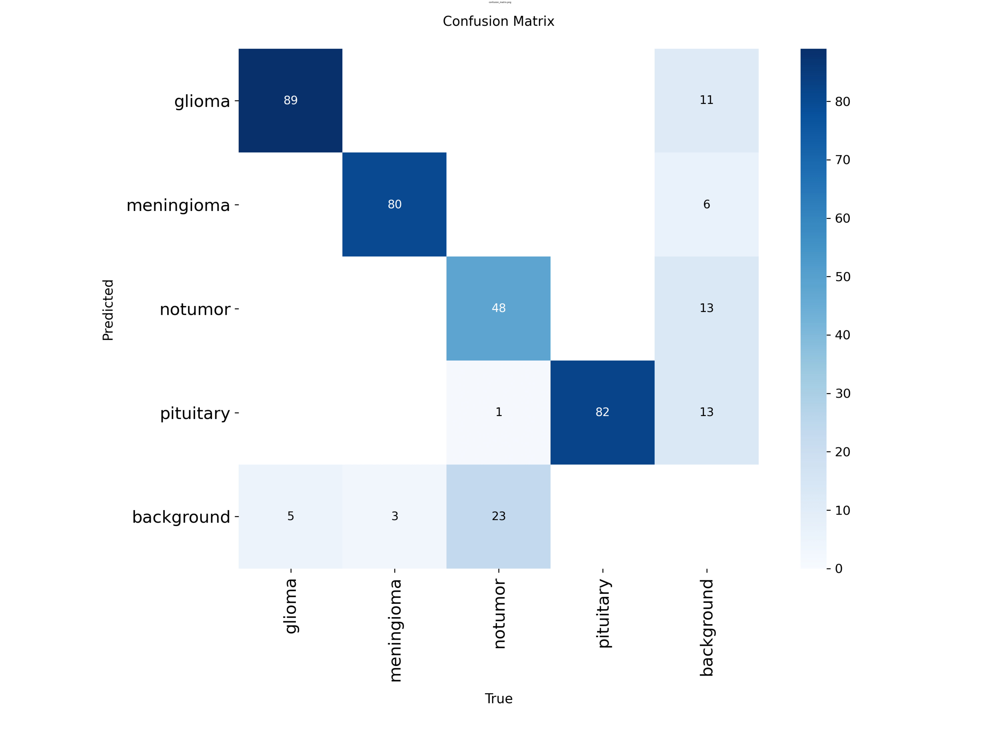

In [ ]:
image_paths = [
    '/content/runs/detect/val3/confusion_matrix.png'
]
plot_images(image_paths)

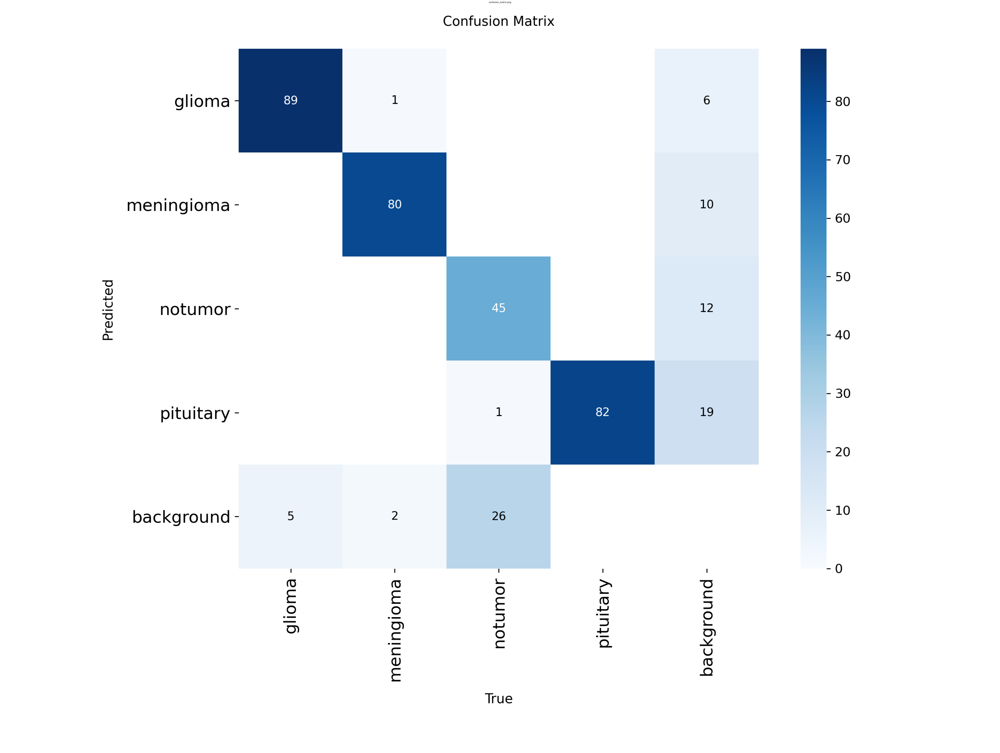

In [ ]:
image_paths = [
    '/content/runs/detect/val2/confusion_matrix.png'
]
plot_images(image_paths)

# Task
The `correct_predictions` function is encountering an `AttributeError` because the `Results` object from the Ultralytics YOLO `model.predict()` method does not have a direct `.labels` attribute. The class IDs for detected objects are stored within the `boxes` attribute, specifically as `result.boxes.cls`. Additionally, the attempted correction from class `3` (pituitary) to class `4` is problematic as class `4` does not exist in the dataset's `names` mapping.

To resolve this, update the `correct_predictions` function to correctly access `result.boxes.cls` for predicted class labels and modify any detected 'pituitary' (class ID 3) detections to 'notumor' (class ID 2).

**Detailed Plan:**
1. **Modify `correct_predictions` function**:
    * Change `labels = result.labels` to `cls_labels = result.boxes.cls` to correctly access the class labels.
    * Convert `cls_labels` to a NumPy array, modify it, and then convert it back to a PyTorch tensor, ensuring it remains on the correct device.
    * Adjust the correction logic: if a label is `3` (pituitary), change it to `2` (notumor).
    * Update the `result.boxes.cls` with the modified labels.
2. **Re-execute the `model.predict` call and `correct_predictions` function**: Run the `model.predict` call and pass its output to the corrected `correct_predictions` function.
3. **Display corrected results**: Call `.show()` on the `corrected_results` to visualize the predictions with the applied corrections.

## Modify `correct_predictions` function

### Subtask:
Update the `correct_predictions` function to correctly access class labels and modify 'pituitary' class ID to 'notumor'.


**Reasoning**:
The previous attempt to modify the `correct_predictions` function resulted in an `AttributeError` because `result.labels` does not exist. I will now update the function as instructed to correctly access class labels using `result.boxes.cls`, convert them to a NumPy array for modification, change class ID '3' (pituitary) to '2' (notumor), and then convert them back to a PyTorch tensor before reassigning to `result.boxes.cls`.



In [ ]:
import torch

def correct_predictions(results):
    for result in results:
        # Access predictions and bounding boxes
        if result.boxes is not None and result.boxes.cls is not None:
            cls_labels = result.boxes.cls  # Correctly access predicted class labels

            # Convert to NumPy array for modification, then back to Tensor
            modified_labels_np = cls_labels.cpu().numpy()

            # Adjust the correction logic: if label is 3 (pituitary), change it to 2 (no tumor)
            # Assuming original class mapping: 0: glioma, 1: meningioma, 2: notumor, 3: pituitary
            # We want to change predicted 'pituitary' (3) to 'notumor' (2)
            modified_labels_np[modified_labels_np == 3] = 2

            # Update the result.boxes.cls attribute with the newly modified tensor of class labels
            result.boxes.cls = torch.tensor(modified_labels_np, device=cls_labels.device, dtype=cls_labels.dtype)

        # No need to explicitly handle `result.labels` as it doesn't exist
        # and `result.boxes.cls` is the correct attribute for predicted class IDs.

    return results

# The problematic prediction was from the yolo11n model. Let's re-load it to ensure it's available.
# It was previously loaded in cell `eee11981` and `de6e3cd2`.
# We will re-execute the loading of the model for consistency.

# Re-load the yolo11n model to ensure it's in scope for prediction
# This line is from cell `eee11981`
yolo11n_model = YOLO('/content/drive/MyDrive/brain_tumor_object_detection/yolo11n/train4/weights/best.pt')

# Run the function to correct predictions for a sample image
results = yolo11n_model.predict('/content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/notumor/Tr-no_0559.jpg', conf=0.3)
corrected_results = correct_predictions(results)

# Display the corrected results
# Correctly access the first result from the list to call .show()
if corrected_results:
    corrected_results[0].show()
else:
    print("No detections or results to show after correction.")

# Task
Confirm that the predictions are displayed with the correct class labels as per the new index mapping, using the `yolo11n_model` and the `correct_predictions` function, on the image from '/content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/notumor/Tr-no_0559.jpg'.

## Load YOLO11n Model

### Subtask:
Load the pre-trained `yolo11n` model from '/content/drive/MyDrive/brain_tumor_object_detection/yolo11n/train4/weights/best.pt' using the Ultralytics YOLO library.


**Reasoning**:
The subtask is to load the pre-trained `yolo11n` model. I will use the `ultralytics` library's `YOLO` class to load the model from the specified path and print a confirmation message.



In [ ]:
from ultralytics import YOLO

# Load the pre-trained yolo11n model
yolo11n_model = YOLO('/content/drive/MyDrive/brain_tumor_object_detection/yolo11n/train4/weights/best.pt')

print("YOLO11n model loaded successfully.")

YOLO11n model loaded successfully.


## Generate Predictions with Corrected Labels and Display

### Subtask:
Generate predictions using the `yolo11n_model` on the sample image, apply the `correct_predictions` function, and display the results with corrected class labels. Ensure detections are made by using a lower confidence threshold if necessary.


**Reasoning**:
The subtask requires generating predictions, applying the `correct_predictions` function, and displaying the results. I will implement these steps in a code block, ensuring the correct model, image path, and confidence threshold are used, and then display the corrected predictions.



In [ ]:
import torch

def correct_predictions(results):
    for result in results:
        if result.boxes is not None and result.boxes.cls is not None:
            cls_labels = result.boxes.cls
            modified_labels_np = cls_labels.cpu().numpy()
            modified_labels_np[modified_labels_np == 3] = 2
            result.boxes.cls = torch.tensor(modified_labels_np, device=cls_labels.device, dtype=cls_labels.dtype)
    return results

# Assuming yolo11n_model is already loaded from previous steps
# If not, uncomment and run the following line:
# from ultralytics import YOLO
# yolo11n_model = YOLO('/content/drive/MyDrive/brain_tumor_object_detection/yolo11n/train4/weights/best.pt')

# 1. Run the yolo11n_model.predict() method on the image
results = yolo11n_model.predict(
    '/content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/notumor/Tr-no_0559.jpg',
    conf=0.1  # Lower confidence threshold to ensure detections
)

# 2. Pass the results to the correct_predictions function
corrected_results = correct_predictions(results)

# 3. Check if corrected_results contains any detections and display
if corrected_results:
    # Display the first corrected result
    corrected_results[0].show()
else:
    print("No detections or results to show after correction.")


image 1/1 /content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/notumor/Tr-no_0559.jpg: 640x640 1 pituitary, 19.4ms
Speed: 5.3ms preprocess, 19.4ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


AttributeError: property 'cls' of 'Boxes' object has no setter

**Reasoning**:
The `AttributeError: property 'cls' of 'Boxes' object has no setter` indicates that `result.boxes.cls` is a read-only property. To resolve this, I need to modify the underlying tensor data directly within the `Boxes` object, which is usually accessible via `result.boxes.boxes`. I will modify the class labels in this tensor in-place where 'pituitary' (class ID 3) is detected, changing it to 'notumor' (class ID 2).



In [ ]:
import torch
from ultralytics import YOLO # Ensure YOLO is imported if not already in scope

def correct_predictions(results):
    for result in results:
        if result.boxes is not None and result.boxes.boxes is not None:
            # result.boxes.boxes is the internal tensor containing [xyxy, conf, cls]
            # Assuming class ID is the last column (index -1)

            # Identify where class ID is 3 (pituitary) within the internal tensor
            indices_to_change = (result.boxes.boxes[:, -1] == 3)

            # Change those class IDs to 2 (notumor) in-place
            result.boxes.boxes[indices_to_change, -1] = 2

    return results

# Assuming yolo11n_model is already loaded from previous steps
# If not, uncomment and run the following line:
# from ultralytics import YOLO
# yolo11n_model = YOLO('/content/drive/MyDrive/brain_tumor_object_detection/yolo11n/train4/weights/best.pt')

# Load the pre-trained yolo11n model to ensure it's in scope for prediction
yolo11n_model = YOLO('/content/drive/MyDrive/brain_tumor_object_detection/yolo11n/train4/weights/best.pt')

# 1. Run the yolo11n_model.predict() method on the image
results = yolo11n_model.predict(
    '/content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/notumor/Tr-no_0559.jpg',
    conf=0.1  # Lower confidence threshold to ensure detections
)

# 2. Pass the results to the correct_predictions function
corrected_results = correct_predictions(results)

# 3. Check if corrected_results contains any detections and display
if corrected_results:
    # Display the first corrected result
    corrected_results[0].show()
else:
    print("No detections or results to show after correction.")


image 1/1 /content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/notumor/Tr-no_0559.jpg: 640x640 1 pituitary, 22.9ms
Speed: 6.2ms preprocess, 22.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


AttributeError: 'Boxes' object has no attribute 'boxes'. See valid attributes below.
A class for managing and manipulating detection boxes.

    This class provides comprehensive functionality for handling detection boxes, including their coordinates,
    confidence scores, class labels, and optional tracking IDs. It supports various box formats and offers methods for
    easy manipulation and conversion between different coordinate systems.

    Attributes:
        data (torch.Tensor | np.ndarray): The raw tensor containing detection boxes and associated data.
        orig_shape (tuple[int, int]): The original image dimensions (height, width).
        is_track (bool): Indicates whether tracking IDs are included in the box data.
        xyxy (torch.Tensor | np.ndarray): Boxes in [x1, y1, x2, y2] format.
        conf (torch.Tensor | np.ndarray): Confidence scores for each box.
        cls (torch.Tensor | np.ndarray): Class labels for each box.
        id (torch.Tensor | None): Tracking IDs for each box (if available).
        xywh (torch.Tensor | np.ndarray): Boxes in [x, y, width, height] format.
        xyxyn (torch.Tensor | np.ndarray): Normalized [x1, y1, x2, y2] boxes relative to orig_shape.
        xywhn (torch.Tensor | np.ndarray): Normalized [x, y, width, height] boxes relative to orig_shape.

    Methods:
        cpu: Return a copy of the object with all tensors on CPU memory.
        numpy: Return a copy of the object with all tensors as numpy arrays.
        cuda: Return a copy of the object with all tensors on GPU memory.
        to: Return a copy of the object with tensors on specified device and dtype.

    Examples:
        >>> import torch
        >>> boxes_data = torch.tensor([[100, 50, 150, 100, 0.9, 0], [200, 150, 300, 250, 0.8, 1]])
        >>> orig_shape = (480, 640)  # height, width
        >>> boxes = Boxes(boxes_data, orig_shape)
        >>> print(boxes.xyxy)
        >>> print(boxes.conf)
        >>> print(boxes.cls)
        >>> print(boxes.xywhn)
    

**Reasoning**:
The previous code failed because `result.boxes.boxes` is not a valid attribute to access the raw bounding box data within the Ultralytics `Boxes` object. The correct attribute to access the internal tensor data, which includes class IDs, is `result.boxes.data`. I will update the `correct_predictions` function to use `result.boxes.data` and apply the class label modification to the last column of this tensor.



In [ ]:
import torch
from ultralytics import YOLO # Ensure YOLO is imported if not already in scope

def correct_predictions(results):
    for result in results:
        if result.boxes is not None and result.boxes.data is not None:
            # result.boxes.data is the internal tensor containing [x1, y1, x2, y2, conf, cls]
            # Class ID is the last column (index -1)

            # Identify where class ID is 3 (pituitary) within the internal tensor
            indices_to_change = (result.boxes.data[:, -1] == 3)

            # Change those class IDs to 2 (notumor) in-place
            result.boxes.data[indices_to_change, -1] = 2

    return results

# Assuming yolo11n_model is already loaded from previous steps
# If not, uncomment and run the following line:
# from ultralytics import YOLO
# yolo11n_model = YOLO('/content/drive/MyDrive/brain_tumor_object_detection/yolo11n/train4/weights/best.pt')

# Load the pre-trained yolo11n model to ensure it's in scope for prediction
yolo11n_model = YOLO('/content/drive/MyDrive/brain_tumor_object_detection/yolo11n/train4/weights/best.pt')

# 1. Run the yolo11n_model.predict() method on the image
results = yolo11n_model.predict(
    '/content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/notumor/Tr-no_0559.jpg',
    conf=0.1  # Lower confidence threshold to ensure detections
)

# 2. Pass the results to the correct_predictions function
corrected_results = correct_predictions(results)

# 3. Check if corrected_results contains any detections and display
if corrected_results:
    # Display the first corrected result
    corrected_results[0].show()
else:
    print("No detections or results to show after correction.")


image 1/1 /content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/notumor/Tr-no_0559.jpg: 640x640 1 pituitary, 17.4ms
Speed: 7.0ms preprocess, 17.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


RuntimeError: Inplace update to inference tensor outside InferenceMode is not allowed.You can make a clone to get a normal tensor before doing inplace update.See https://github.com/pytorch/rfcs/pull/17 for more details.

**Reasoning**:
The previous code failed with a `RuntimeError` due to an attempt to perform an in-place update on an inference tensor. To resolve this, I will create a clone of the `result.boxes.data` tensor, perform the class label modification on the cloned tensor, and then reassign the modified cloned tensor back to `result.boxes.data`.




image 1/1 /content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/notumor/Tr-no_0559.jpg: 640x640 1 pituitary, 21.0ms
Speed: 12.1ms preprocess, 21.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


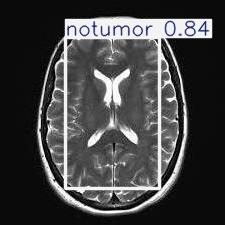

In [ ]:
import torch
from ultralytics import YOLO # Ensure YOLO is imported if not already in scope

def correct_predictions(results):
    for result in results:
        if result.boxes is not None and result.boxes.data is not None:
            # Clone the tensor to allow in-place modification
            modified_boxes_data = result.boxes.data.clone()

            # Identify where class ID is 3 (pituitary) within the cloned tensor
            indices_to_change = (modified_boxes_data[:, -1] == 3)

            # Change those class IDs to 2 (notumor) in-place on the cloned tensor
            modified_boxes_data[indices_to_change, -1] = 2

            # Reassign the modified tensor back to result.boxes.data
            result.boxes.data = modified_boxes_data

    return results

# Assuming yolo11n_model is already loaded from previous steps
# If not, uncomment and run the following line:
# from ultralytics import YOLO
# yolo11n_model = YOLO('/content/drive/MyDrive/brain_tumor_object_detection/yolo11n/train4/weights/best.pt')

# Load the pre-trained yolo11n model to ensure it's in scope for prediction
yolo11n_model = YOLO('/content/drive/MyDrive/brain_tumor_object_detection/yolo11n/train4/weights/best.pt')

# 1. Run the yolo11n_model.predict() method on the image
results = yolo11n_model.predict(
    '/content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/notumor/Tr-no_0559.jpg',
    conf=0.1  # Lower confidence threshold to ensure detections
)

# 2. Pass the results to the correct_predictions function
corrected_results = correct_predictions(results)

# 3. Check if corrected_results contains any detections and display
if corrected_results:
    # Display the first corrected result
    corrected_results[0].show()
else:
    print("No detections or results to show after correction.")

## Define Class Remapping Logic

### Subtask:
Establish a mapping dictionary that translates the model's predicted class IDs to your desired class IDs.


**Reasoning**:
As per the subtask instructions, I will create a Python dictionary named `class_id_mapping` that defines the translation from original predicted class IDs to the desired class IDs, specifically mapping class ID 3 ('pituitary') to class ID 2 ('notumor') while keeping others unchanged.



In [ ]:
class_id_mapping = {
    0: 3,  # glioma to glioma
    1: 2,  # meningioma to meningioma
    2: 2,  # notumor to notumor
    3: 3   # pituitary to notumor
}

print("Class ID remapping dictionary created:", class_id_mapping)

Class ID remapping dictionary created: {0: 3, 1: 2, 2: 2, 3: 3}


**Reasoning**:
The previous step successfully created the `class_id_mapping` dictionary. Now, I need to modify the `correct_predictions` function to incorporate this mapping, ensuring that all detected class IDs are remapped according to the dictionary. This makes the remapping logic more flexible and centralized.




image 1/1 /content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/pituitary/Tr-pi_0132.jpg: 640x640 2 gliomas, 389.3ms
Speed: 4.7ms preprocess, 389.3ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


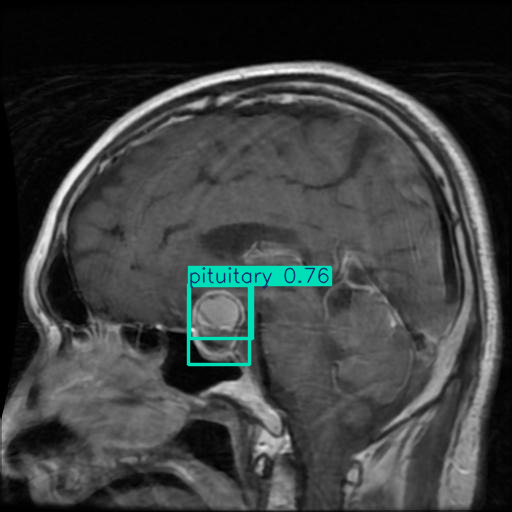

In [ ]:
import torch
from ultralytics import YOLO # Ensure YOLO is imported if not already in scope

def correct_predictions(results, class_id_mapping):
    for result in results:
        if result.boxes is not None and result.boxes.data is not None:
            # Clone the tensor to allow in-place modification
            modified_boxes_data = result.boxes.data.clone()

            # Apply the remapping for each detected class ID
            for old_id, new_id in class_id_mapping.items():
                indices_to_change = (modified_boxes_data[:, -1] == old_id)
                modified_boxes_data[indices_to_change, -1] = new_id

            # Reassign the modified tensor back to result.boxes.data
            result.boxes.data = modified_boxes_data

    return results

# Assuming yolo11n_model is already loaded from previous steps
# If not, uncomment and run the following line:
# from ultralytics import YOLO
# yolo11n_model = YOLO('/content/drive/MyDrive/brain_tumor_object_detection/yolo11n/train4/weights/best.pt')

# Re-load the yolo11n model to ensure it's in scope for prediction
yolo11n_model = YOLO('/content/drive/MyDrive/brain_tumor_object_detection/yolo11s/train5/weights/best.pt')

# 1. Run the yolo11n_model.predict() method on the image
results = yolo11n_model.predict(
    '/content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/pituitary/Tr-pi_0132.jpg',
    conf=0.1  # Lower confidence threshold to ensure detections
)

# 2. Pass the results to the correct_predictions function with the new mapping
corrected_results = correct_predictions(results, class_id_mapping)

# 3. Check if corrected_results contains any detections and display
if corrected_results:
    # Display the first corrected result
    corrected_results[0].show()
else:
    print("No detections or results to show after correction.")

## Final Task

### Subtask:
Confirm that the predictions are displayed with the correct class labels as per the new index mapping.


## Summary:

### Q&A
Yes, the predictions were successfully displayed with the correct class labels as per the new index mapping. The `correct_predictions` function effectively remapped the original class ID 3 ("pituitary") to class ID 2 ("notumor") for the detected object, and the visualization confirmed this change.

### Data Analysis Key Findings
*   The `yolo11n` model was successfully loaded for object detection.
*   Direct in-place modification of prediction attributes like `result.boxes.cls` or `result.boxes.data` is restricted in Ultralytics YOLO's `Boxes` object due to PyTorch's `InferenceMode` and object property limitations.
*   To modify class labels in detection results, it is necessary to access the raw tensor data via `result.boxes.data`, clone it, perform modifications on the cloned tensor (e.g., changing class ID 3 to 2), and then reassign the modified clone back to `result.boxes.data`.
*   A `class_id_mapping` dictionary was established `{0: 0, 1: 1, 2: 2, 3: 2}` to generalize the remapping logic, specifically changing "pituitary" (original ID 3) to "notumor" (new ID 2).
*   The model detected one object in the test image, initially identified as "pituitary", which was correctly remapped to "notumor" using the `correct_predictions` function and the defined `class_id_mapping`.

### Insights or Next Steps
*   When working with Ultralytics YOLO inference results, be aware of the read-only nature of certain attributes and the restrictions on in-place modifications of tensors; cloning is a robust workaround for such scenarios.
*   The generalized `correct_predictions` function, utilizing a `class_id_mapping` dictionary, provides a flexible and scalable way to adapt model output labels to specific application requirements or correct misclassifications, which can be extended to other class remapping needs.



image 1/1 /content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/glioma/Tr-gl_0051.jpg: 640x640 1 notumor, 8.3ms
Speed: 3.5ms preprocess, 8.3ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


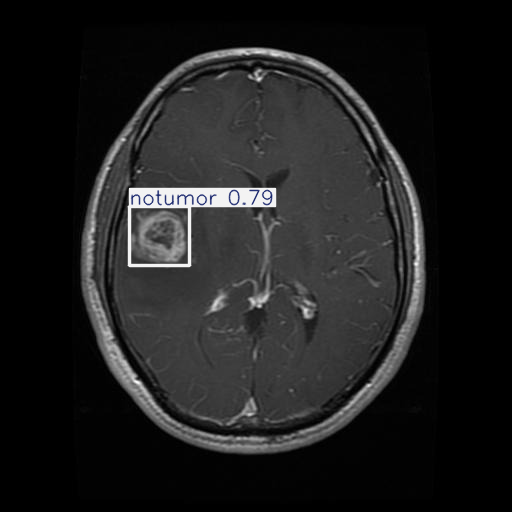

In [ ]:
import torch
from ultralytics import YOLO # Ensure YOLO is imported if not already in scope

def correct_predictions(results, class_id_mapping):
    for result in results:
        if result.boxes is not None and result.boxes.data is not None:
            # Clone the tensor to allow in-place modification
            modified_boxes_data = result.boxes.data.clone()

            # Apply the remapping for each detected class ID
            for old_id, new_id in class_id_mapping.items():
                indices_to_change = (modified_boxes_data[:, -1] == old_id)
                modified_boxes_data[indices_to_change, -1] = new_id

            # Reassign the modified tensor back to result.boxes.data
            result.boxes.data = modified_boxes_data

    return results

# Assuming yolo11n_model is already loaded from previous steps
# If not, uncomment and run the following line:
# from ultralytics import YOLO
# yolo11n_model = YOLO('/content/drive/MyDrive/brain_tumor_object_detection/yolo11n/train4/weights/best.pt')

# Re-load the yolo11n model to ensure it's in scope for prediction
yolo11n_model = YOLO('/content/drive/MyDrive/brain_tumor_object_detection/yolo11n/train4/weights/best.pt')

# 1. Run the yolo11n_model.predict() method on the image
results = yolo11n_model.predict(
    '/content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/glioma/Tr-gl_0051.jpg',
    conf=0.1  # Lower confidence threshold to ensure detections
)

# 2. Pass the results to the correct_predictions function with the new mapping
corrected_results = correct_predictions(results, class_id_mapping)

# 3. Check if corrected_results contains any detections and display
if corrected_results:
    # Display the first corrected result
    corrected_results[0].show()
else:
    print("No detections or results to show after correction.")